In [2]:
import pandas as pd
import os
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from shapely import wkt
import contextily as ctx
from IPython.display import Image, display
import seaborn as sns
from matplotlib.patches import Patch
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from shapely.wkt import loads as wkt_loads
from math import radians, cos, sin, asin, sqrt
from statsmodels.nonparametric.smoothers_lowess import lowess

/Users/Administrator/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
def plot_points(df):
    df_unique = df.drop_duplicates(subset='geometry').copy()

    #convert to GeoDataFrame
    df_unique[['lon', 'lat']] = df_unique['geometry'].str.extract(r'POINT \(([^ ]+) ([^ ]+)\)').astype(float)
    gdf = gpd.GeoDataFrame(
        df_unique,
        geometry=gpd.points_from_xy(df_unique['lon'], df_unique['lat']),
        crs="EPSG:4326"
    )

    # NL map
    fig, ax = plt.subplots(figsize=(10, 10))
    gdf.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=5, alpha=0.7)  # Web Mercator
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_title("Unique Wells in Netherlands")
    plt.show()

def count_points_by_filter(df, plot_histogram=True):
    df = df.copy()

    # Convert 'Date' to datetime
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

    # filter only years >= 2000
    df_filtered = df[df['Date'].dt.year >= 2000]

    counts = df_filtered.groupby('Filter').size()

    if plot_histogram:
        counts.plot(kind='bar')
        plt.xlabel('Filter Number')
        plt.ylabel('Number of Data Points')
        plt.title('Data Points per Filter (after 2000)')
        plt.xticks(rotation=0)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()

    return counts.to_dict()

def plot_timeseries_for_well(df, well_id):
    df = df.copy()

    df_filtered = df[
        (df['Well_ID'] == well_id) &
        (df['Filter'] == 1)
    ]

    if df_filtered.empty:
        print(f"No data found for Well_ID {well_id} with Filter 1.")
        return

    df_filtered = df_filtered.sort_values('Date')

    plt.figure(figsize=(10, 5))
    plt.plot(df_filtered['Date'], df_filtered['Depth'], marker='o', linestyle='-')

    plt.ylim(-4.75, -3) 

    plt.title(f"Groundwater Depth over Time for Well {well_id} (Filter 1)")
    plt.xlabel("Date")
    plt.ylabel("Waterstand (meter t.o.v. NAP)")
    plt.grid(True)
    plt.show()


# Flevoland

In [3]:
province = "flevoland"
variable = "depth"

current_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
path = os.path.join(base_dir, f'data/raw/well_{variable}_data/{province}_well_{variable}_combined.csv')

In [4]:
df = pd.read_csv(path)

In [5]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce', utc=True)

In [6]:
print(f"Total number of data points: {len(df)}")

Total number of data points: 30291661


Check for missing values across all columns

In [7]:
df.isna().sum()

Well_ID               0
BRO-ID                0
Filter                0
Date                137
Depth            185053
geometry              0
Ground Level      49869
Bottom Screen         0
Top Screen            0
dtype: int64

In [16]:
df[df['Date'].isna()]

,Well_ID,BRO-ID,Filter,Date,Depth,geometry,Ground Level,Bottom Screen,Top Screen
5554461,GMW000000037690,GLD000000011171,1,NaT,-0.08,POINT (5.773439025 52.629534337),0.30,-13.5,-12.5
5554462,GMW000000037690,GLD000000011171,1,NaT,0.07,POINT (5.773439025 52.629534337),0.30,-13.5,-12.5
5554463,GMW000000037690,GLD000000011171,1,NaT,-0.08,POINT (5.773439025 52.629534337),0.30,-13.5,-12.5
5554464,GMW000000037690,GLD000000011171,1,NaT,-0.06,POINT (5.773439025 52.629534337),0.30,-13.5,-12.5
5554465,GMW000000037690,GLD000000011171,1,NaT,-0.14,POINT (5.773439025 52.629534337),0.30,-13.5,-12.5
...,...,...,...,...,...,...,...,...,...
5566893,GMW000000037720,GLD000000011603,6,NaT,-0.32,POINT (5.776344747 52.657474692),1.75,-17.0,-16.0
5566900,GMW000000037720,GLD000000011603,6,NaT,-0.26,POINT (5.776344747 52.657474692),1.75,-17.0,-16.0
5566901,GMW000000037720,GLD000000011603,6,NaT,-0.19,POINT (5.776344747 52.657474692),1.75,-17.0,-16.0
5566902,GMW000000037720,GLD000000011603,6,NaT,-0.34,POINT (5.776344747 52.657474692),1.75,-17.0,-16.0


Find which year is the most represented

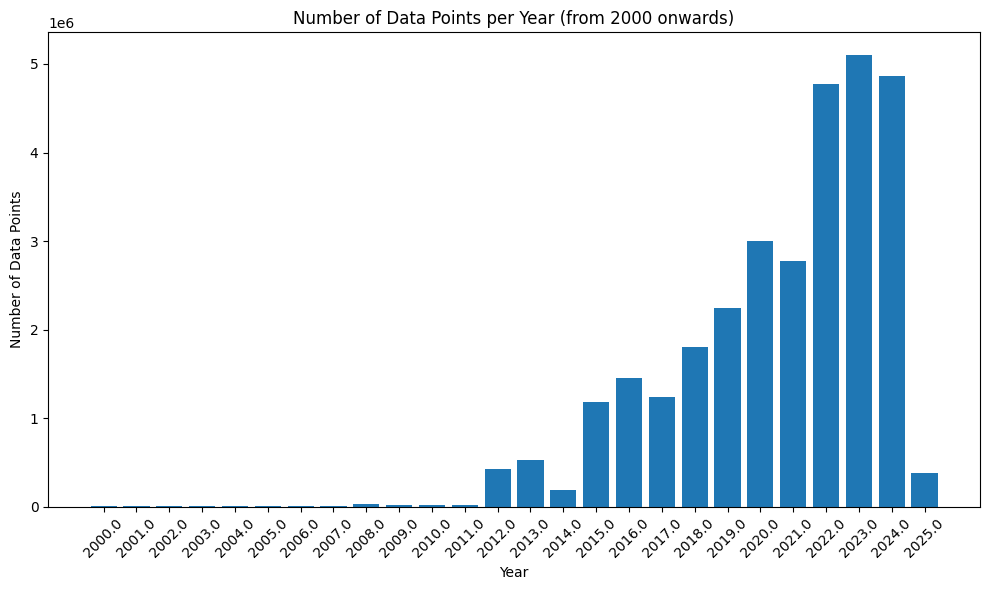

In [13]:
df_year = pd.DataFrame({'Year': df['Date'].dt.year})

df_filtered = df_year[df_year['Year'] >= 2000]

# Count data points per year
year_counts = df_filtered['Year'].value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 6))
plt.bar(year_counts.index.astype(str), year_counts.values)
plt.xlabel("Year")
plt.ylabel("Number of Data Points")
plt.title("Number of Data Points per Year (from 2000 onwards)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [12]:
year_counts.head(100)

,Year,Count
0,1935.0,43
1,1936.0,36
2,1937.0,25
3,1938.0,41
4,1939.0,35
...,...,...
84,2021.0,2770004
85,2022.0,4774781
86,2023.0,5102489
87,2024.0,4865309


Drop rows with missing "Depth" values

In [131]:
df_no_nan.isna().sum()

Well_ID              0
BRO-ID               0
Filter               0
Date                 0
Depth                0
geometry             0
Ground Level     31400
Bottom Screen        0
Top Screen           0
dtype: int64

In [79]:
len(df_no_nan)

5859068

In [18]:
df_after_2000 = df[df['Date'].dt.year >= 2000]

In [133]:
df_after_2000.isna().sum()

Well_ID              0
BRO-ID               0
Filter               0
Date                 0
Depth            15767
geometry             0
Ground Level     31400
Bottom Screen        0
Top Screen           0
dtype: int64

In [ ]:
df_after_2000 = df.dropna(subset=['Depth'])
df_after_2000 = df_after_2000.dropna(subset=['Date'])

In [81]:
print(f"Number of data points after year 2000: {len(df_after_2000)}")

Number of data points after year 2000: 5775988


In [25]:
filtered_df = df_after_2000[df_after_2000['Filter'] == 0]
filtered_df

,Well_ID,BRO-ID,Filter,Date,Depth,geometry,Ground Level,Bottom Screen,Top Screen
16194070,GMW000000057155,GLD000000067080,0,2022-01-24 11:00:54+00:00,-5.286,POINT (5.435237737 52.486779939),-4.84,-9.64,-8.64
16194071,GMW000000057155,GLD000000067080,0,2022-01-24 11:01:54+00:00,-5.298,POINT (5.435237737 52.486779939),-4.84,-9.64,-8.64
16194072,GMW000000057155,GLD000000067080,0,2022-01-24 11:02:55+00:00,-5.303,POINT (5.435237737 52.486779939),-4.84,-9.64,-8.64
16194073,GMW000000057155,GLD000000067080,0,2022-01-24 11:03:56+00:00,-5.313,POINT (5.435237737 52.486779939),-4.84,-9.64,-8.64
16194074,GMW000000057155,GLD000000067080,0,2022-01-24 11:04:57+00:00,-5.319,POINT (5.435237737 52.486779939),-4.84,-9.64,-8.64
...,...,...,...,...,...,...,...,...,...
22561280,GMW000000057160,GLD000000067085,0,2023-07-27 05:00:00+00:00,-5.652,POINT (5.454801934 52.474965086),-4.50,-9.20,-8.20
22561281,GMW000000057160,GLD000000067085,0,2023-07-27 06:00:00+00:00,-5.643,POINT (5.454801934 52.474965086),-4.50,-9.20,-8.20
22561282,GMW000000057160,GLD000000067085,0,2023-07-27 07:00:00+00:00,-5.641,POINT (5.454801934 52.474965086),-4.50,-9.20,-8.20
22561283,GMW000000057160,GLD000000067085,0,2023-07-27 08:00:00+00:00,-5.636,POINT (5.454801934 52.474965086),-4.50,-9.20,-8.20


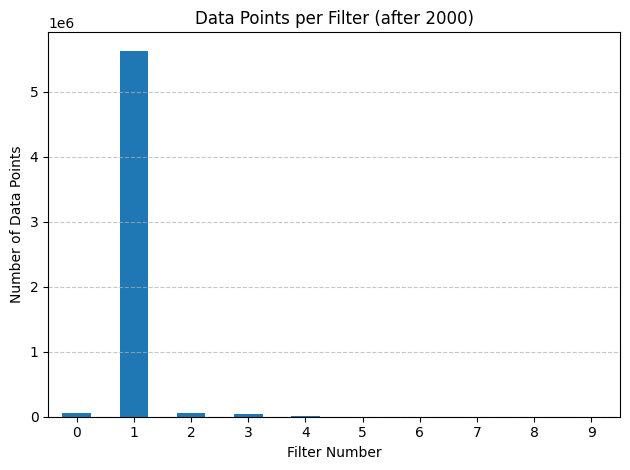

{0: 50000, 1: 5634783, 2: 54532, 3: 40193, 4: 4915, 5: 2206, 6: 2211, 7: 1797, 8: 1064, 9: 54}


In [84]:
counts = count_points_by_filter(df)
print(counts)

In [86]:
n_unique_wells = df_after_2000['Well_ID'].nunique()
print(f"Number of unique wells: {n_unique_wells}")

Number of unique wells: 1048


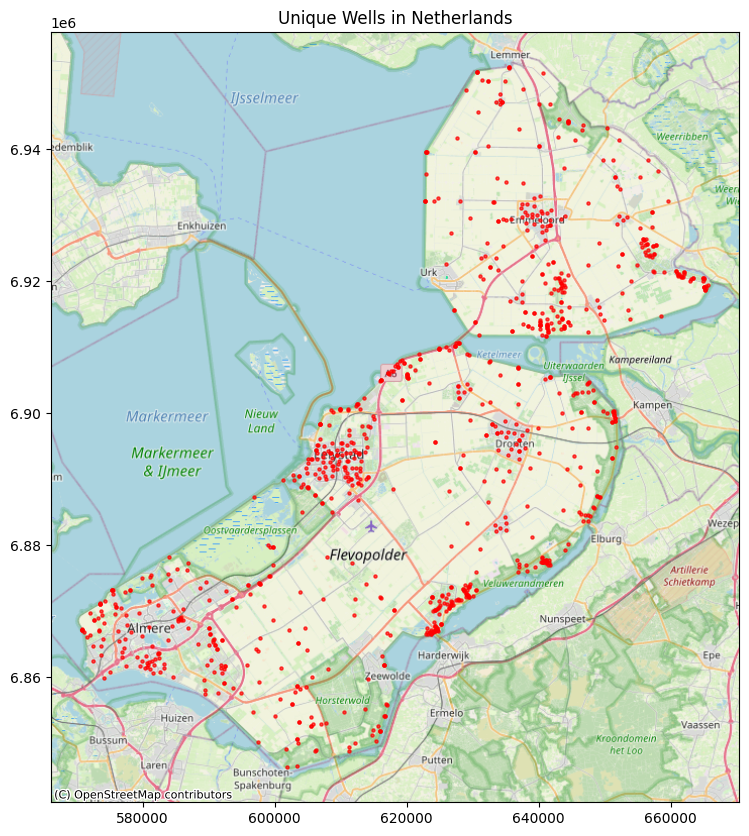

In [85]:
plot_points(df_after_2000)

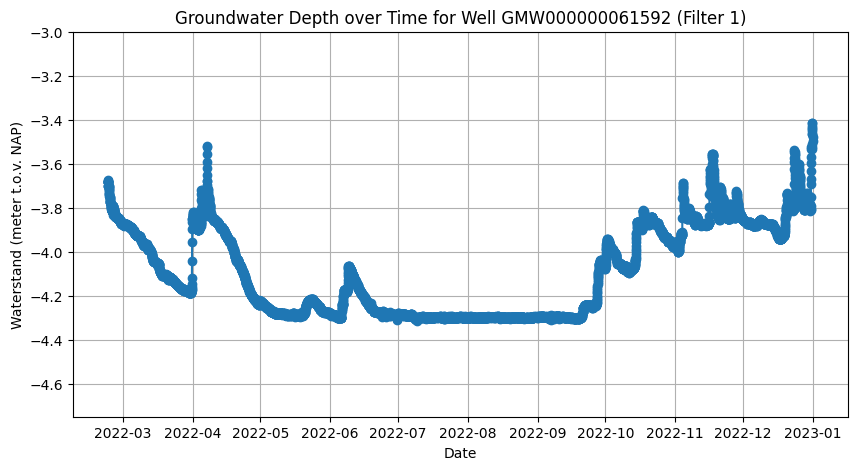

In [130]:
plot_timeseries_for_well(df_after_2000, "GMW000000061592")

# Utrecht

### Exploring *raw* data; after year 2000; all filters

In [3]:
province = "utrecht"
variable = "depth"

current_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
path = os.path.join(base_dir, f'data/raw/well_{variable}_data/{province}_well_{variable}_combined.csv')

In [4]:
df_depth = pd.read_csv(path)

In [5]:
df_depth['Date'] = pd.to_datetime(df_depth['Date'], errors='coerce', utc=True)

In [6]:
# Number of data points across all years

df_depth['Year'] = df_depth['Date'].dt.year
len(df_depth)

30200376

In [7]:
# year selection (2000)

df_depth_2000 = df_depth[df_depth['Year'] >= 2000]
print(f"Total number of data points after year 2000: {len(df_depth_2000)}")

Total number of data points after year 2000: 29953979


In [94]:
# Number of duplicates in dataset

num_duplicates = df_depth_2000.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 1724598


In [95]:
# Missing values per column

missing_values = df_depth_2000.isnull().sum()
print(missing_values)

Well_ID               0
BRO-ID                0
Filter                0
Date                  0
Depth             52786
geometry              0
Ground Level     366164
Bottom Screen         0
Top Screen            0
Year                  0
dtype: int64


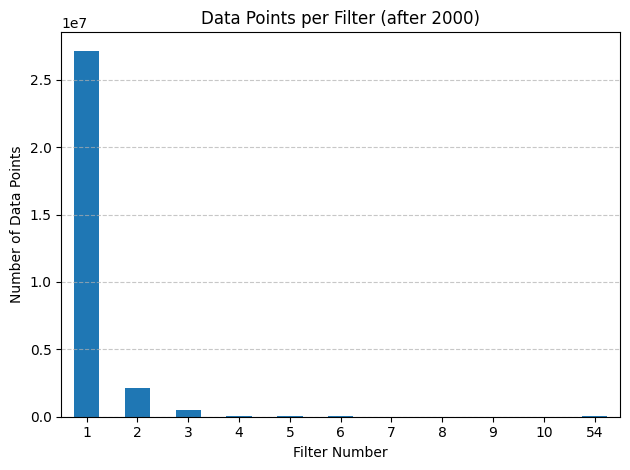

{1: 27167544, 2: 2149702, 3: 474722, 4: 67118, 5: 28447, 6: 18918, 7: 10133, 8: 349, 9: 515, 10: 335, 54: 36196}


In [96]:
# Number data points per filter

counts = count_points_by_filter(df_depth_2000)
print(counts)

## Preprocessed data

#### - Filters: 1, 2, 3
#### - Year: 2000
#### - Removed duplicates
#### - Removed rows with missing values (only cases when there was another data point with identical other columns and valid Depth value)

In [9]:
province = "utrecht"
variable = "depth"

current_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
path = os.path.join(base_dir, f'data/clean/well_{variable}_data/{province}_well_{variable}_combined.csv')

In [10]:
df_depth_proprocessed = pd.read_csv(path)

In [11]:
# Total number of data points
len(df_depth_proprocessed)

28068433

In [102]:
# Check missing values that are not removed yet

missing = df_depth_proprocessed.isnull().sum()
print(missing)

Well_ID               0
BRO-ID                0
Filter                0
Date                  0
Depth             45674
geometry              0
Ground Level     366011
Bottom Screen         0
Top Screen            0
Year                  0
dtype: int64


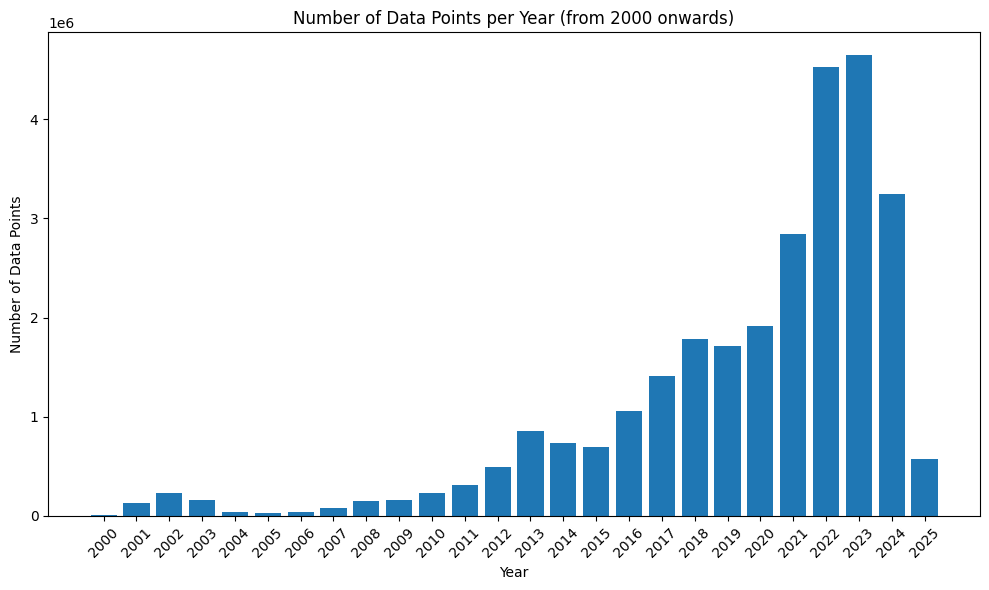

In [103]:
# Distribution of data points across years

year_counts = df_depth_proprocessed['Year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(year_counts.index.astype(str), year_counts.values)
plt.xlabel("Year")
plt.ylabel("Number of Data Points")
plt.title("Number of Data Points per Year (from 2000 onwards)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [130]:
n_unique_wells = df_depth_proprocessed['Well_ID'].nunique()
print(f"Number of unique wells for filters 1, 2, 3: {n_unique_wells}")

Number of unique wells for filters 1, 2, 3: 1077


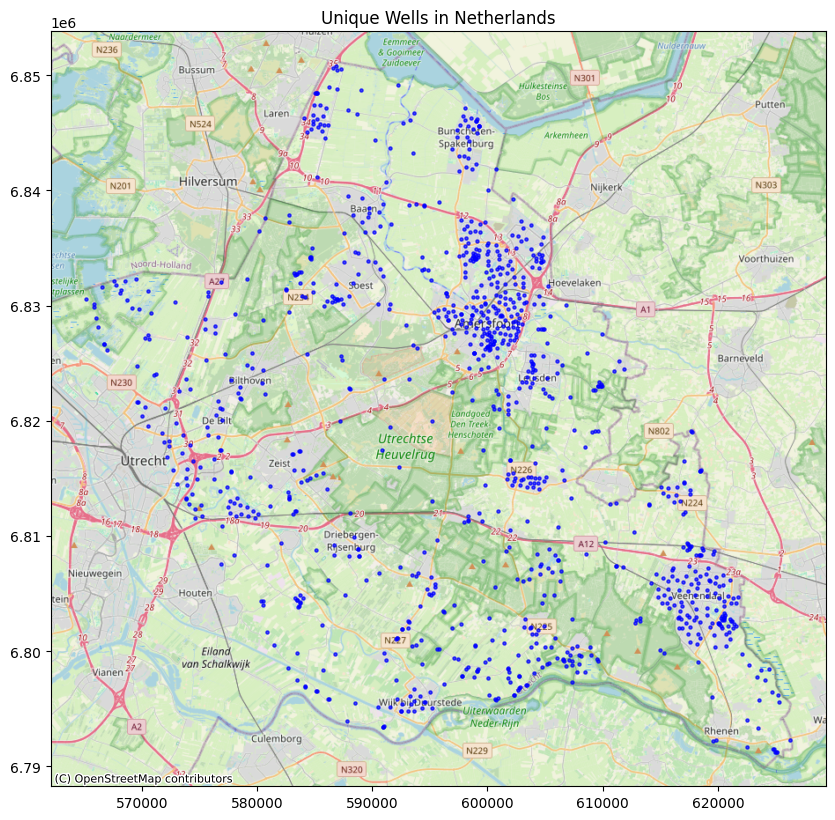

In [126]:
plot_points(df_depth_proprocessed)

### Well overlap between Nitrate and Depth datasets

In [138]:
# Load preprocessed Nitrate data

province = "utrecht"
variable = "chem"

current_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
path = os.path.join(base_dir, f'data/clean/well_{variable}_data/{province}_well_{variable}_combined.csv')

In [139]:
df_chem_preprocessed = pd.read_csv(path)

In [131]:
wells_depth = set(df_depth_proprocessed['Well_ID'].dropna().unique())
wells_chem = set(df_chem_preprocessed['Well_ID'].dropna().unique())

unique_depth = df_depth_proprocessed['Well_ID'].nunique(dropna=False)
unique_chem = df_chem_preprocessed['Well_ID'].nunique(dropna=False)

# find the intersection
common_wells = wells_depth.intersection(wells_chem)

print(f"Unique Well-IDs in depth dataset (including NaN): {unique_depth}")
print(f"Unique Well-IDs in nitrate dataset (including NaN): {unique_chem}")

print(f"Number of common Well-IDs: {len(common_wells)}")

Unique Well-IDs in depth dataset (including NaN): 1077
Unique Well-IDs in nitrate dataset (including NaN): 94
Number of common Well-IDs: 35


In [ ]:
df_depth_proprocessed['geometry'] = df_depth_proprocessed['geometry'].apply(wkt.loads)
df_chem_preprocessed['geometry'] = df_chem_preprocessed['geometry'].apply(wkt.loads)

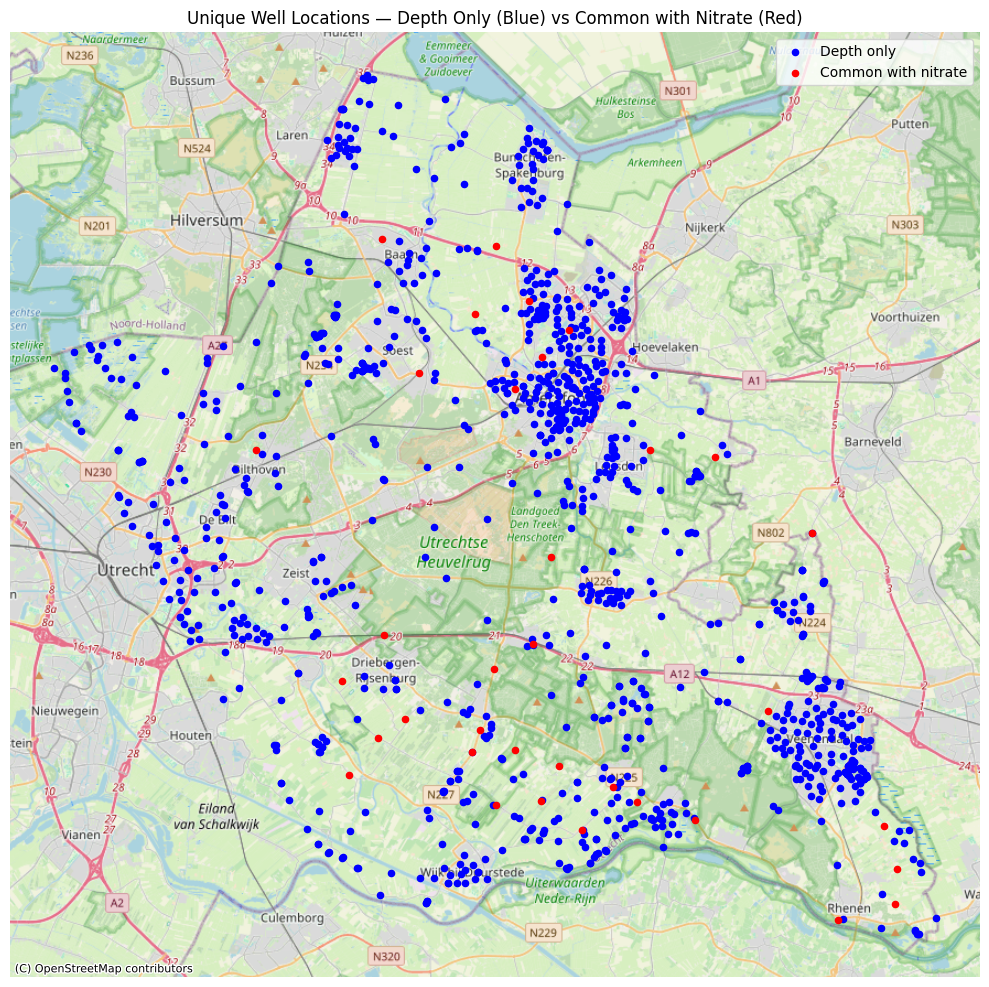

In [140]:
# Display Well overlap on the map

# Create GeoDataFrames
gdf_depth = gpd.GeoDataFrame(df_depth_proprocessed, geometry='geometry', crs="EPSG:4326")
gdf_chem = gpd.GeoDataFrame(df_chem_preprocessed, geometry='geometry', crs="EPSG:4326")

# Get unique wells (one geometry per Well_ID)
gdf_depth_unique = gdf_depth.drop_duplicates(subset='Well_ID')[['Well_ID', 'geometry']]
gdf_chem_unique = gdf_chem.drop_duplicates(subset='Well_ID')[['Well_ID', 'geometry']]

# Find common Well_IDs
common_ids = set(gdf_depth_unique['Well_ID']).intersection(set(gdf_chem_unique['Well_ID']))

# Mark which wells are common
gdf_depth_unique['is_common'] = gdf_depth_unique['Well_ID'].apply(lambda x: x in common_ids)

# Reproject for basemap
gdf_depth_unique = gdf_depth_unique.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))
gdf_depth_unique[~gdf_depth_unique['is_common']].plot(ax=ax, color='blue', markersize=20, label='Depth only')
gdf_depth_unique[gdf_depth_unique['is_common']].plot(ax=ax, color='red', markersize=20, label='Common with nitrate')
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title("Unique Well Locations — Depth Only (Blue) vs Common with Nitrate (Red)")
ax.axis('off')
ax.legend()
plt.tight_layout()
plt.show()

## Filter 3

In [37]:
# Load Depth data only for filter 3

province = "utrecht"
variable = "depth"
filter = 3

current_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
path = os.path.join(base_dir, f'data/clean/well_{variable}_data/{province}_well_{variable}_combined_{filter}.csv')

In [38]:
df_depth_3 = pd.read_csv(path)

In [39]:
print(f"Total number of data points: {len(df_depth_3)}")

Total number of data points: 466230


In [40]:
# Show missing values per column
missing_3 = df_depth_3.isnull().sum()
print(missing_3)

Well_ID            0
BRO-ID             0
Filter             0
Date               0
Depth             12
geometry           0
Ground Level     735
Bottom Screen      0
Top Screen         0
Year               0
dtype: int64


In [41]:
unique_depth_3 = df_depth_3['Well_ID'].nunique(dropna=False)
print(f"Number of unique wells: {unique_depth_3}")

Number of unique wells: 65


#### Overlap of wells with Nitrate dataset

In [42]:
province = "utrecht"
variable = "chem"
filter = 3

current_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
path = os.path.join(base_dir, f'data/clean/well_{variable}_data/{province}_well_{variable}_combined_{filter}.csv')

In [43]:
df_chem_3 = pd.read_csv(path)

In [44]:
wells_depth = set(df_depth_3['Well_ID'].dropna().unique())
wells_chem = set(df_chem_3['Well_ID'].dropna().unique())

unique_depth = df_depth_3['Well_ID'].nunique(dropna=False)
unique_chem = df_chem_3['Well_ID'].nunique(dropna=False)

# find the intersection
common_wells = wells_depth.intersection(wells_chem)

print(f"Unique Well-IDs in Depth dataset (including NaN): {unique_depth}")
print(f"Unique Well-IDs in Nitrate dataset (including NaN): {unique_chem}")

print(f"Number of common Well_IDs: {len(common_wells)}")

common_wells

Unique Well-IDs in Depth dataset (including NaN): 65
Unique Well-IDs in Nitrate dataset (including NaN): 22
Number of common Well_IDs: 7


{'GMW000000003998',
 'GMW000000004007',
 'GMW000000004027',
 'GMW000000023801',
 'GMW000000023918',
 'GMW000000023976',
 'GMW000000042630'}

In [45]:
df_depth_3['geometry'] = df_depth_3['geometry'].apply(wkt.loads)
df_chem_3['geometry'] = df_chem_3['geometry'].apply(wkt.loads)

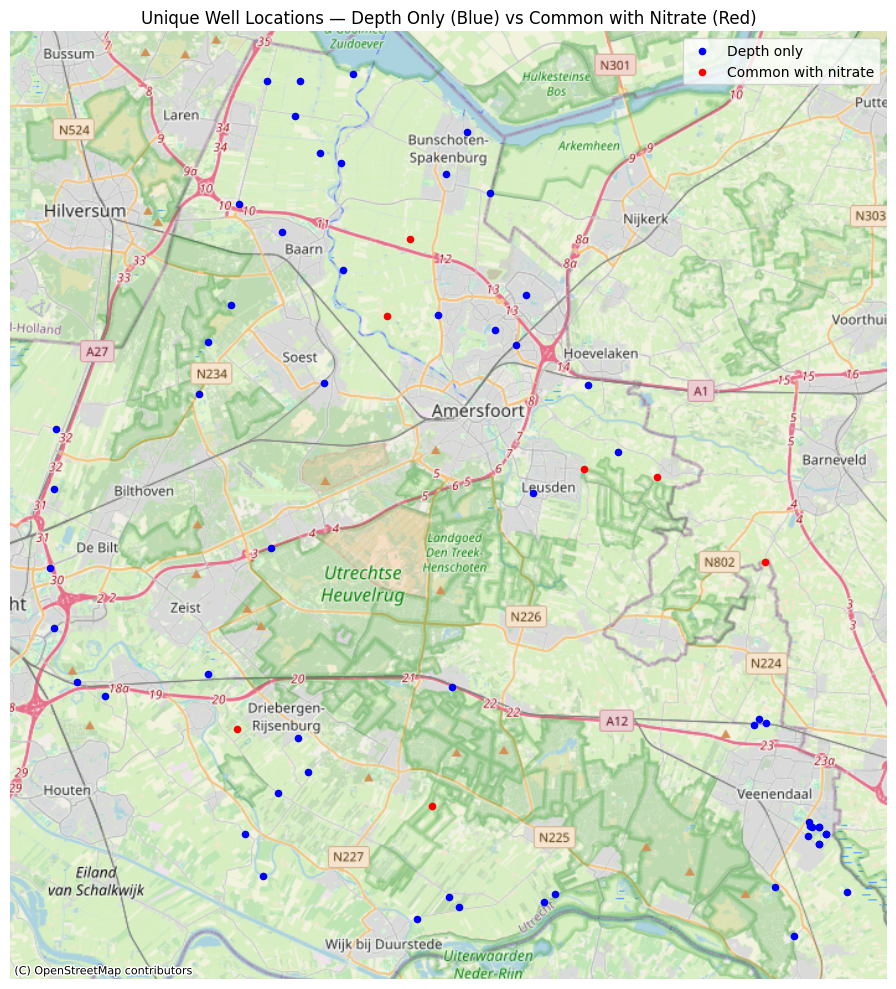

In [46]:
# Create GeoDataFrames
gdf_depth = gpd.GeoDataFrame(df_depth_3, geometry='geometry', crs="EPSG:4326")
gdf_chem = gpd.GeoDataFrame(df_chem_3, geometry='geometry', crs="EPSG:4326")

# Get unique wells (one geometry per Well_ID)
gdf_depth_unique = gdf_depth.drop_duplicates(subset='Well_ID')[['Well_ID', 'geometry']]
gdf_chem_unique = gdf_chem.drop_duplicates(subset='Well_ID')[['Well_ID', 'geometry']]

# Find common Well_IDs
common_ids = set(gdf_depth_unique['Well_ID']).intersection(set(gdf_chem_unique['Well_ID']))

# Mark which wells are common
gdf_depth_unique['is_common'] = gdf_depth_unique['Well_ID'].apply(lambda x: x in common_ids)

# Reproject for basemap
gdf_depth_unique = gdf_depth_unique.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))
gdf_depth_unique[~gdf_depth_unique['is_common']].plot(ax=ax, color='blue', markersize=20, label='Depth only')
gdf_depth_unique[gdf_depth_unique['is_common']].plot(ax=ax, color='red', markersize=20, label='Common with nitrate')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title("Unique Well Locations — Depth Only (Blue) vs Common with Nitrate (Red)")
ax.axis('off')
ax.legend()
plt.tight_layout()
plt.show()

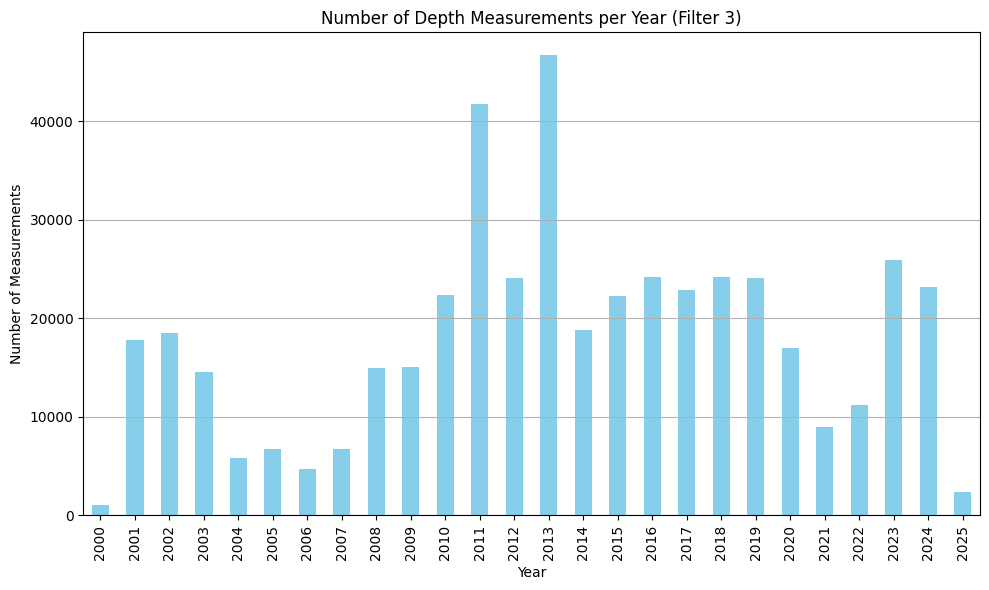

In [47]:
# Number of data points across years

df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'], errors='coerce')

df_depth_3['Year'] = df_depth_3['Date'].dt.year

# Count number of entries per year
year_counts = df_depth_3['Year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
year_counts.plot(kind='bar', color='skyblue')
plt.title(f'Number of Depth Measurements per Year (Filter {filter})')
plt.xlabel('Year')
plt.ylabel('Number of Measurements')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [48]:
# Check if any of the wells have constant sampling frequency across years

df_depth_3['Delta_Days'] = df_depth_3.groupby('Well_ID')['Date'].diff().dt.total_seconds() / (60 * 60 * 24)

# Drop NaNs (first row per well)
df_clean = df_depth_3.dropna(subset=['Delta_Days'])

# Group by Well_ID and calculate std deviation of sampling intervals
std_per_well = df_clean.groupby('Well_ID')['Delta_Days'].std()

# Wells with exactly constant interval (std == 0)
constant_wells = std_per_well[std_per_well == 0].index.tolist()

print(f"Number of wells with constant sampling frequency: {len(constant_wells)}")
print("Example Well IDs:", constant_wells[:5])

Number of wells with constant sampling frequency: 0
Example Well IDs: []


In [49]:
# Show the sampling frequences that are taking place in the dataset

df = df_depth_3.sort_values(by=['Well_ID', 'Date']).reset_index(drop=True)

# Calculate time differences (sampling frequency) per well
df['Time_Diff'] = df.groupby('Well_ID')['Date'].diff()

# Show summary statistics of sampling frequency
sampling_freq_summary = df['Time_Diff'].describe()

# Show most common sampling intervals
common_intervals = df['Time_Diff'].value_counts()

with pd.option_context('display.max_rows', None):
    print(df['Time_Diff'].value_counts())  # Sorted by count descending

Time_Diff
0 days 01:00:00       169889
0 days 12:00:00       127920
0 days 00:15:00        74011
0 days 03:00:00        39051
0 days 06:00:00        32705
0 days 02:00:00         7496
1 days 00:00:00         3642
14 days 00:00:00        3400
17 days 00:00:00        1219
16 days 00:00:00        1153
15 days 00:00:00         970
0 days 04:00:00          895
18 days 00:00:00         579
13 days 00:00:00         475
0 days 05:00:00          439
19 days 00:00:00         126
31 days 00:00:00         125
0 days 07:00:00          123
11 days 00:00:00         101
12 days 00:00:00          99
30 days 00:00:00          88
32 days 00:00:00          86
0 days 01:15:00           85
29 days 00:00:00          67
0 days 08:00:00           60
28 days 00:00:00          54
20 days 00:00:00          53
14 days 01:00:00          52
13 days 23:00:00          49
33 days 00:00:00          47
21 days 00:00:00          43
0 days 09:00:00           32
18 days 01:00:00          27
17 days 23:00:00          27
14 d

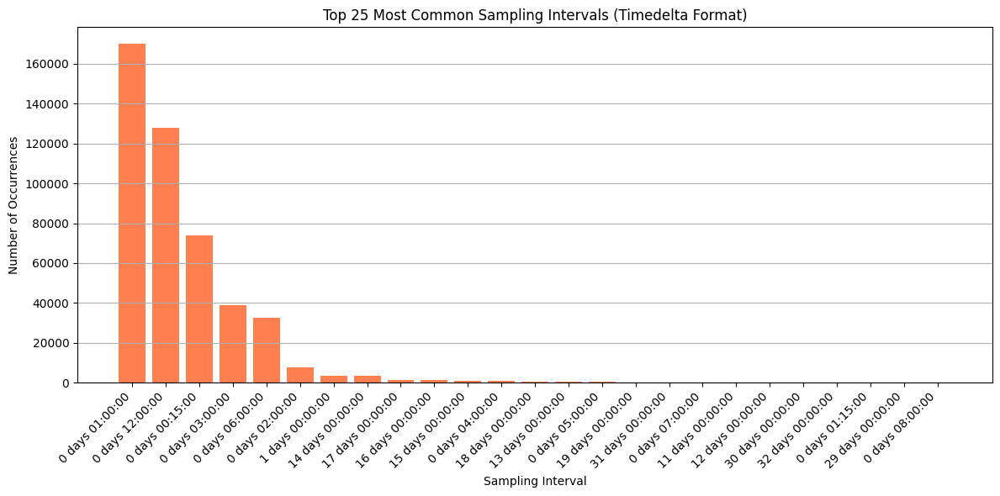

In [50]:
top_intervals = common_intervals.head(25)

labels = top_intervals.index.astype(str)

plt.figure(figsize=(12, 6))
plt.bar(range(len(top_intervals)), top_intervals.values, color='coral')
plt.xticks(ticks=range(len(labels)), labels=labels, rotation=45, ha='right')
plt.xlabel("Sampling Interval")
plt.ylabel("Number of Occurrences")
plt.title("Top 25 Most Common Sampling Intervals (Timedelta Format)")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

### Checking which years are available for each well

In [51]:
df_depth_3['Year'] = df_depth_3['Date'].dt.year

In [52]:
# Count number of unique years per Well_ID
well_year_coverage = df_depth_3.groupby('Well_ID')['Year'].nunique().sort_values(ascending=False)

# Show top wells with the longest year coverage
top_wells = well_year_coverage.head(20)
print("Top wells with the most year coverage:")
print(top_wells)

Top wells with the most year coverage:
Well_ID
GMW000000004090    25
GMW000000004007    25
GMW000000023873    25
GMW000000003963    24
GMW000000024060    24
GMW000000023918    24
GMW000000010120    24
GMW000000010092    24
GMW000000024020    24
GMW000000023914    24
GMW000000042619    24
GMW000000042644    24
GMW000000003980    23
GMW000000023950    23
GMW000000004052    20
GMW000000024000    20
GMW000000068599    20
GMW000000068894    20
GMW000000024040    17
GMW000000025970    16
Name: Year, dtype: int64


In [53]:
common_well_coverage = well_year_coverage[well_year_coverage.index.isin(common_wells)]

# Sort and display
common_well_coverage_sorted = common_well_coverage.sort_values(ascending=False)

print("Year coverage for wells in common_wells:")
print(common_well_coverage_sorted)

Year coverage for wells in common_wells:
Well_ID
GMW000000004007    25
GMW000000023918    24
GMW000000042630     8
GMW000000003998     8
GMW000000023801     8
GMW000000023976     8
GMW000000004027     5
Name: Year, dtype: int64


/var/folders/fr/h0n611t55y51b_mts5q50l540000gn/T/ipykernel_13509/1648537666.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot = pivot.applymap(lambda x: 1 if x > 0 else 0)  # convert to presence/absence


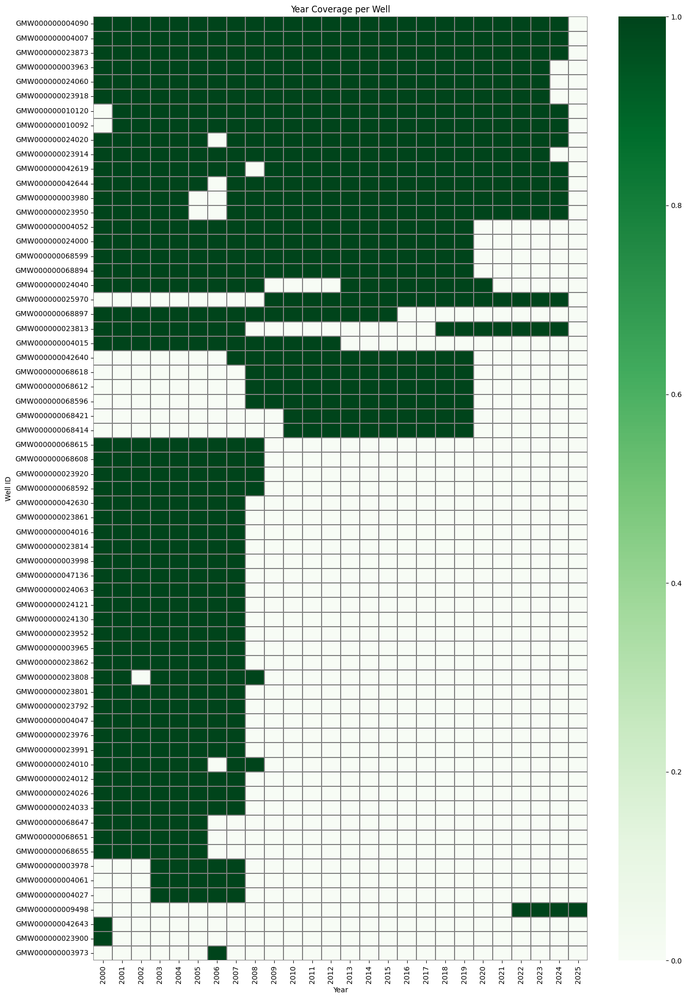

In [54]:
# Group by well and year — keep only (Well_ID, Year) pairs that exist
well_years = df_depth_3.groupby(['Well_ID', 'Year']).size().reset_index(name='count')

# Pivot for plotting: one row per well, one column per year (presence = 1, absence = 0)
pivot = well_years.pivot_table(index='Well_ID', columns='Year', values='count', fill_value=0)
pivot = pivot.applymap(lambda x: 1 if x > 0 else 0)  # convert to presence/absence

# Sort by total year coverage
pivot['year_coverage'] = pivot.sum(axis=1)
pivot = pivot.sort_values('year_coverage', ascending=False).drop(columns='year_coverage')

# Create a custom color palette with as many unique colors as wells
n_wells = pivot.shape[0]
palette = sns.color_palette("tab20", n_colors=n_wells)  # or try "husl", "Set3", etc.

# Use seaborn heatmap
plt.figure(figsize=(14, len(pivot) * 0.3))
sns.heatmap(
    pivot,
    cmap="Greens",  # still show presence/absence
    cbar=True,
    linewidths=0.1,
    linecolor='gray'
)

plt.title("Year Coverage per Well")
plt.xlabel("Year")
plt.ylabel("Well ID")
plt.yticks(ticks=[i + 0.5 for i in range(len(pivot.index))], labels=pivot.index, rotation=0)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [55]:
# Select 5 wells with highest year coverage and furtherest from each other

highlight_wells = {
    "GMW000000004090", "GMW000000023873", "GMW000000003963",
    "GMW000000024060", "GMW000000023918"
}

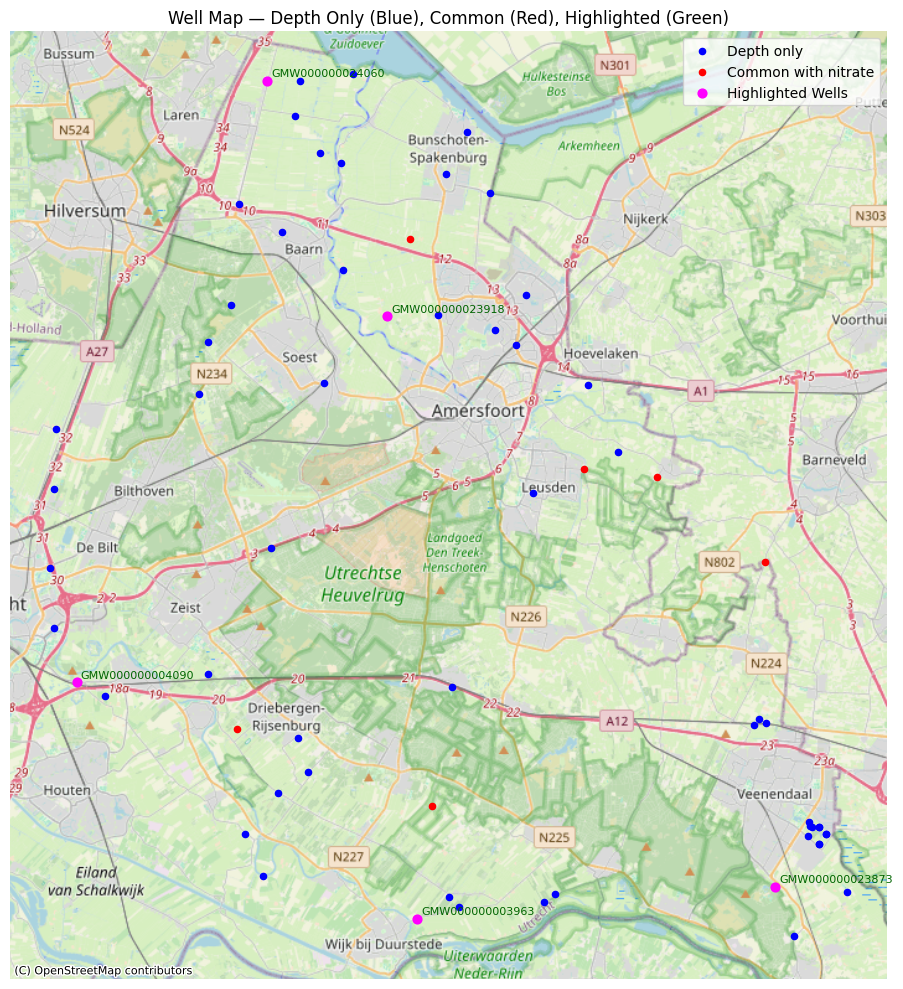

In [56]:
gdf_depth_unique['is_highlighted'] = gdf_depth_unique['Well_ID'].apply(lambda x: x in highlight_wells)

# Plot base layer
fig, ax = plt.subplots(figsize=(10, 10))
gdf_depth_unique[~gdf_depth_unique['is_common']].plot(ax=ax, color='blue', markersize=20, label='Depth only')
gdf_depth_unique[gdf_depth_unique['is_common'] & ~gdf_depth_unique['is_highlighted']].plot(ax=ax, color='red', markersize=20, label='Common with nitrate')

# Plot highlighted wells in green
gdf_depth_unique[gdf_depth_unique['is_highlighted']].plot(ax=ax, color='magenta', markersize=40, label='Highlighted Wells')

# Add labels for highlighted wells
for _, row in gdf_depth_unique[gdf_depth_unique['is_highlighted']].iterrows():
    ax.annotate(row['Well_ID'], xy=(row.geometry.x, row.geometry.y), xytext=(3, 3), textcoords='offset points', fontsize=8, color='darkgreen')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title("Well Map — Depth Only (Blue), Common (Red), Highlighted (Green)")
ax.axis('off')
ax.legend()
plt.tight_layout()
plt.show()

## Sampling frequency across years

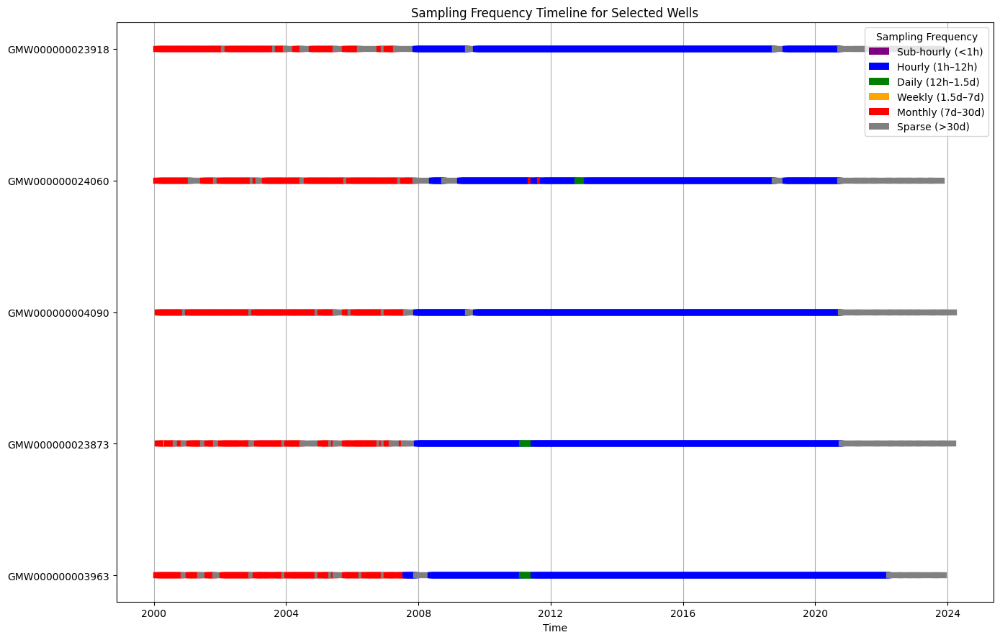

In [57]:
df_selected = df_depth_3[df_depth_3['Well_ID'].isin(highlight_wells)].copy()
df_selected['Date'] = pd.to_datetime(df_selected['Date'])

# Sort and calculate time deltas
df_selected = df_selected.sort_values(by=['Well_ID', 'Date'])
df_selected['delta_days'] = df_selected.groupby('Well_ID')['Date'].diff().dt.total_seconds() / (60*60*24)

# Define frequency bins
def classify_freq(days):
    if pd.isna(days):
        return None
    if days <= 0.04:   # one hour or less
        return 'Sub-hourly'
    elif days <= 0.5:   # 12 hours or less
        return 'Hourly'
    elif days <= 1.5: # 1.5 days or less
        return 'Daily'
    elif days <= 7:
        return 'Weekly'
    elif days <= 30:
        return 'Monthly'
    else:
        return 'Sparse'

df_selected['Frequency'] = df_selected['delta_days'].apply(classify_freq)

# Drop rows with missing delta
df_vis = df_selected.dropna(subset=['delta_days'])

fig, ax = plt.subplots(figsize=(14, 4 + len(highlight_wells)))

colors = {
    'Sub-hourly': 'purple',
    'Hourly': 'blue',
    'Daily': 'green',
    'Weekly': 'orange',
    'Monthly': 'red',
    'Sparse': 'gray'
}

for i, well in enumerate(highlight_wells):
    subset = df_vis[df_vis['Well_ID'] == well]
    for j in range(len(subset) - 1):
        start = subset.iloc[j]['Date']
        end = subset.iloc[j + 1]['Date']
        freq = subset.iloc[j + 1]['Frequency']
        ax.plot([start, end], [i, i], color=colors.get(freq, 'black'), linewidth=6)

ax.set_yticks(range(len(highlight_wells)))
ax.set_yticklabels(highlight_wells)
ax.set_xlabel("Time")
ax.set_title("Sampling Frequency Timeline for Selected Wells")
plt.grid(True, axis='x')

legend_elements = [
    Patch(facecolor='purple', label='Sub-hourly (<1h)'),
    Patch(facecolor='blue', label='Hourly (1h–12h)'),
    Patch(facecolor='green', label='Daily (12h–1.5d)'),
    Patch(facecolor='orange', label='Weekly (1.5d–7d)'),
    Patch(facecolor='red', label='Monthly (7d–30d)'),
    Patch(facecolor='gray', label='Sparse (>30d)')
]
ax.legend(handles=legend_elements, title="Sampling Frequency", loc='upper right')

plt.tight_layout()
plt.show()


/var/folders/fr/h0n611t55y51b_mts5q50l540000gn/T/ipykernel_13509/1872612976.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vis['delta_days_rounded'] = df_vis['delta_days'].round(5)


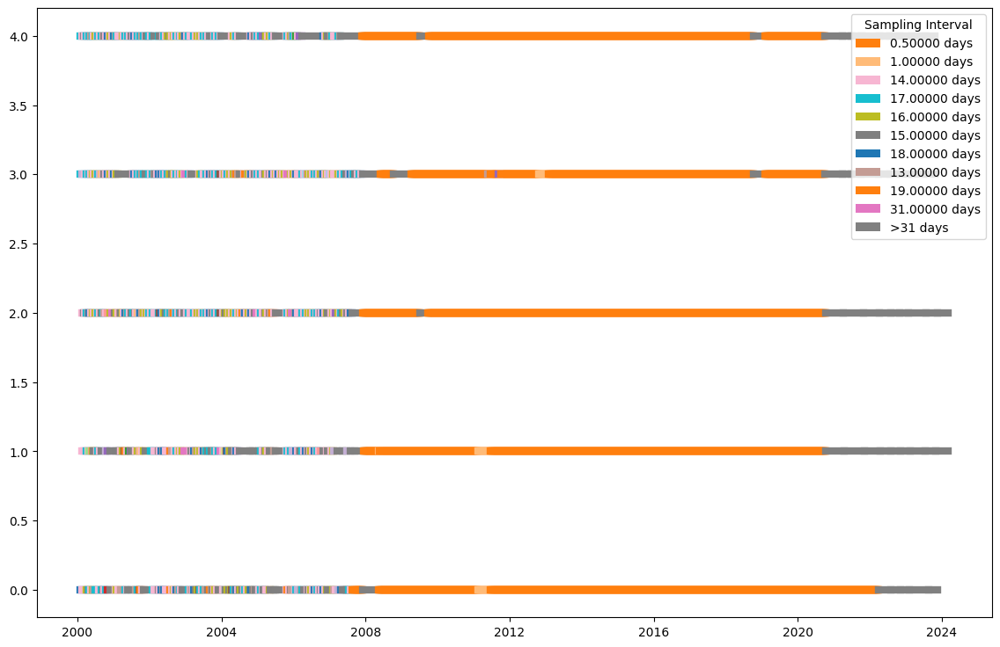

In [58]:
df_selected = df_depth_3[df_depth_3['Well_ID'].isin(highlight_wells)].copy()
df_selected['Date'] = pd.to_datetime(df_selected['Date'])

# Sort and calculate time deltas
df_selected = df_selected.sort_values(by=['Well_ID', 'Date'])
df_selected['delta_days'] = df_selected.groupby('Well_ID')['Date'].diff().dt.total_seconds() / (60*60*24)

# Filter only valid rows
df_vis = df_selected.dropna(subset=['delta_days'])

# Round to seconds for precise equality (optional, improves grouping)
df_vis['delta_days_rounded'] = df_vis['delta_days'].round(5)

# Get unique values ≤ 31
unique_intervals = df_vis[df_vis['delta_days_rounded'] <= 31]['delta_days_rounded'].unique()
unique_intervals = np.sort(unique_intervals)

# Assign a unique color to each interval
color_list = plt.cm.tab20.colors  # or plt.cm.get_cmap('hsv', len(unique_intervals)), or seaborn.color_palette
repeats = int(np.ceil(len(unique_intervals) / len(color_list)))
full_color_list = (color_list * repeats)[:len(unique_intervals)]

# Create the mapping
interval_color_map = {interval: color for interval, color in zip(unique_intervals, full_color_list)}

# Default color for large intervals
default_color = 'gray'

fig, ax = plt.subplots(figsize=(14, 4 + len(highlight_wells)))

for i, well in enumerate(highlight_wells):
    subset = df_vis[df_vis['Well_ID'] == well].sort_values('Date')
    for j in range(len(subset) - 1):
        start = subset.iloc[j]['Date']
        end = subset.iloc[j + 1]['Date']
        delta = round(subset.iloc[j + 1]['delta_days'], 5)
        color = interval_color_map.get(delta, default_color)
        ax.plot([start, end], [i, i], color=color, linewidth=6)

# Choose top N most common for legend
top_intervals = df_vis[df_vis['delta_days_rounded'] <= 31]['delta_days_rounded'].value_counts().nlargest(10).index

legend_elements = [
    Patch(facecolor=interval_color_map[ival], label=f"{ival:.5f} days")
    for ival in top_intervals
] + [Patch(facecolor='gray', label='>31 days')]

ax.legend(handles=legend_elements, title="Sampling Interval", loc='upper right')


## Timeseries for one summer week 2016

In [253]:
# Here we defind unique colors that we will use for all the plots in the future
well_color_map = dict(zip(highlight_wells, palette))

df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])
df_depth_3['Year'] = df_depth_3['Date'].dt.year
df_depth_3['Month'] = df_depth_3['Date'].dt.month

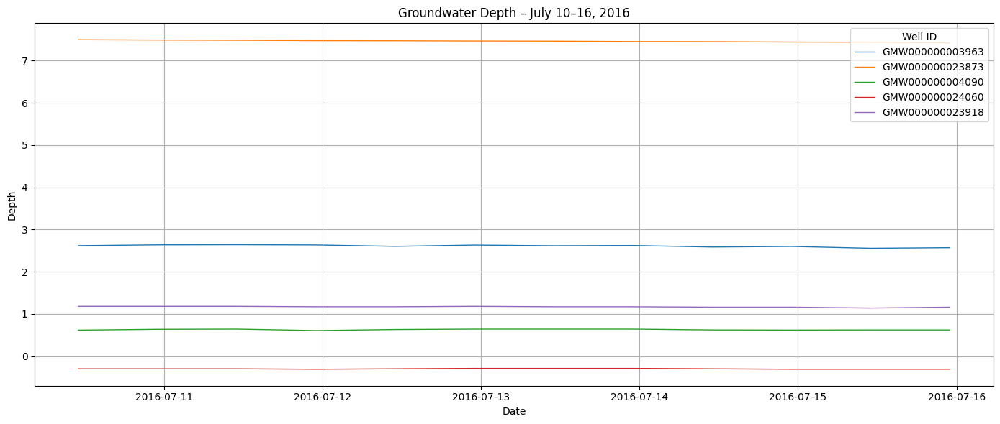

In [200]:
start_date = "2016-07-10"
end_date = "2016-07-16"

df_week = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Date'] >= start_date) &
    (df_depth_3['Date'] <= end_date)
].sort_values(by=['Well_ID', 'Date'])

plt.figure(figsize=(14, 6))
for well_id in highlight_wells:
    well_data = df_week[df_week['Well_ID'] == well_id]
    plt.plot(well_data['Date'], well_data['Depth'], label=well_id, linewidth=1)

plt.title("Groundwater Depth – July 10–16, 2016")
plt.xlabel("Date")
plt.ylabel("Depth")
plt.legend(title="Well ID")
plt.grid(True)
plt.tight_layout()
plt.show()

## Timeseries for one winter week 2016

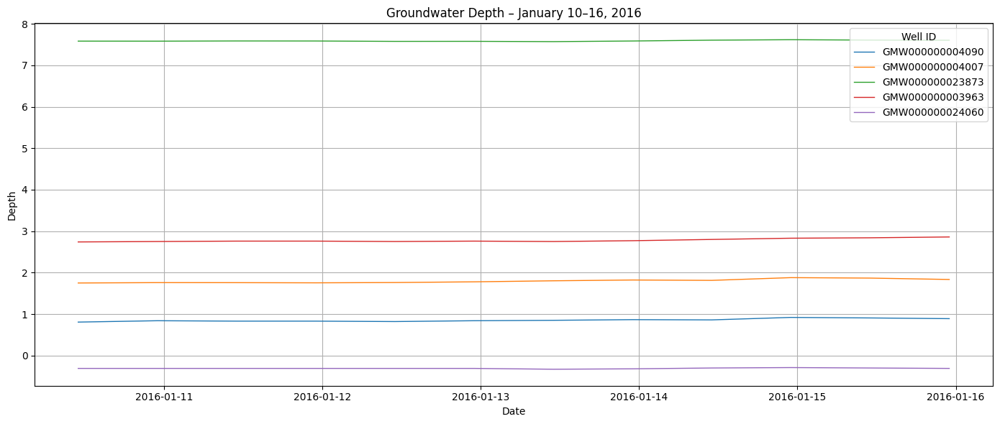

In [212]:
start_date = "2016-01-10"
end_date = "2016-01-16"

df_week = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Date'] >= start_date) &
    (df_depth_3['Date'] <= end_date)
].sort_values(by=['Well_ID', 'Date'])

plt.figure(figsize=(14, 6))
for well_id in highlight_wells:
    well_data = df_week[df_week['Well_ID'] == well_id]
    plt.plot(well_data['Date'], well_data['Depth'], label=well_id, linewidth=1)

plt.title("Groundwater Depth – January 10–16, 2016")
plt.xlabel("Date")
plt.ylabel("Depth")
plt.legend(title="Well ID")
plt.grid(True)
plt.tight_layout()
plt.show()

## Timeseries for one summer month 2016

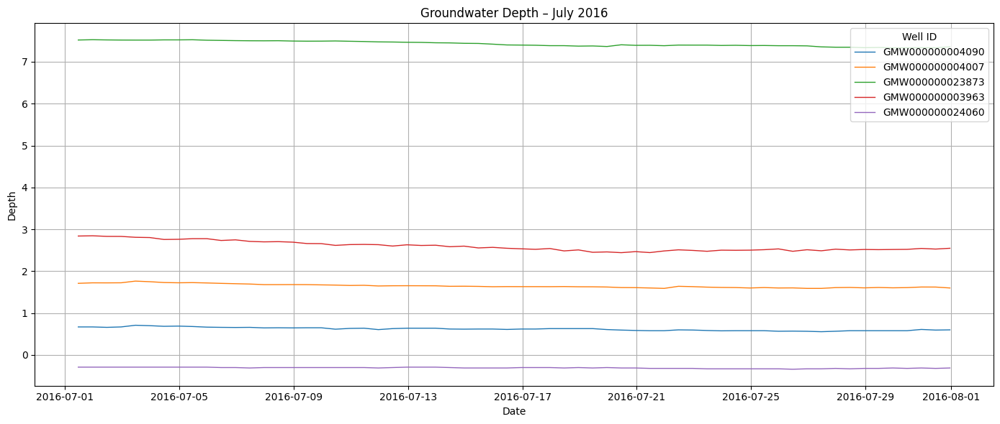

In [199]:
df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])

# Filter 5 wells and July 2016

df_july_2016 = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Date'].dt.year == 2016) &
    (df_depth_3['Date'].dt.month == 7)
]

# Sort values just in case
df_july_2016 = df_july_2016.sort_values(by=['Well_ID', 'Date'])

# Plot
plt.figure(figsize=(14, 6))
for well_id in highlight_wells:
    well_data = df_july_2016[df_july_2016['Well_ID'] == well_id]
    plt.plot(well_data['Date'], well_data['Depth'], label=well_id, linewidth=1)

plt.title("Groundwater Depth – July 2016")
plt.xlabel("Date")
plt.ylabel("Depth")
plt.legend(title="Well ID")
plt.grid(True)
plt.tight_layout()
plt.show()

## Boxplots plots per month across years

### Winter

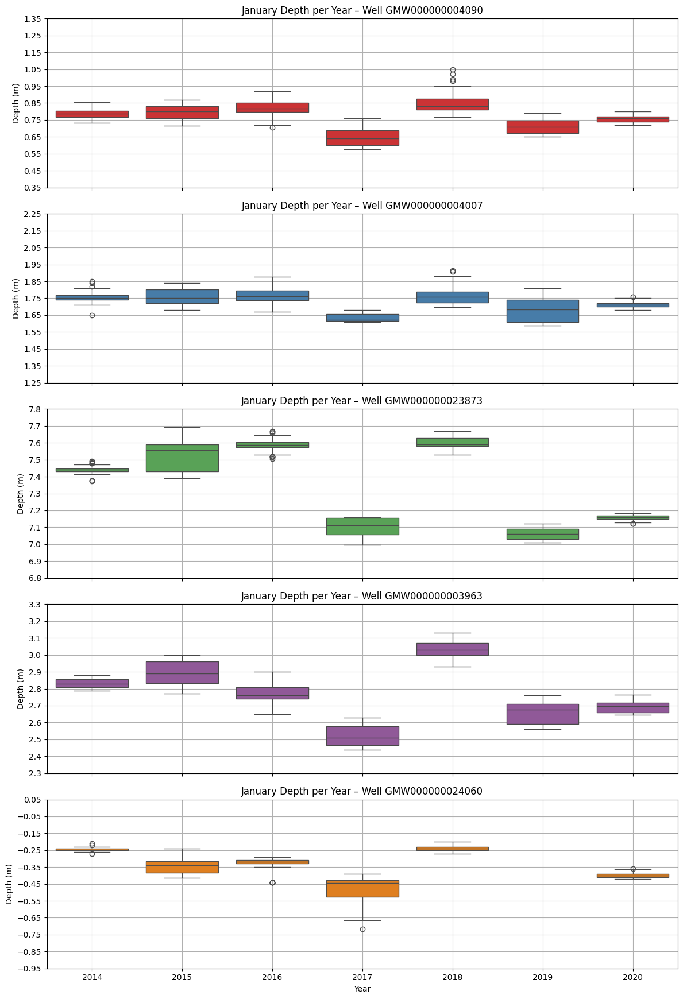

In [262]:
jan_data = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Month'] == 1) &
    (df_depth_3['Year'].between(2014, 2020))
]

# Desired visual tick step
tick_interval = 0.1
target_num_ticks = 10  # Aim for ~10 ticks on each plot

# Plot
fig, axes = plt.subplots(len(highlight_wells), 1, figsize=(12, 3.5 * len(highlight_wells)), sharex=True)

for i, well_id in enumerate(highlight_wells):
    ax = axes[i]
    well_data = jan_data[jan_data['Well_ID'] == well_id]

    # Get well-specific depth range
    dmin = well_data['Depth'].min()
    dmax = well_data['Depth'].max()

    # Round min/max to nearest 0.1
    dmin_rounded = np.floor(dmin / tick_interval) * tick_interval
    dmax_rounded = np.ceil(dmax / tick_interval) * tick_interval

    # Expand range if too small to get enough ticks
    while (dmax_rounded - dmin_rounded) < (tick_interval * (target_num_ticks - 1)):
        dmin_rounded -= tick_interval / 2
        dmax_rounded += tick_interval / 2

    # Create tick list
    yticks = np.arange(dmin_rounded, dmax_rounded + tick_interval, tick_interval)

    # Plot
    sns.boxplot(data=well_data, x='Year', y='Depth', ax=ax, color=well_color_map[well_id])
    ax.set_title(f"January Depth per Year – Well {well_id}")
    ax.set_ylabel("Depth (m)")
    ax.set_ylim(dmin_rounded, dmax_rounded)
    ax.set_yticks(yticks)
    ax.grid(True)

axes[-1].set_xlabel("Year")
plt.tight_layout()
plt.show()

### Spring

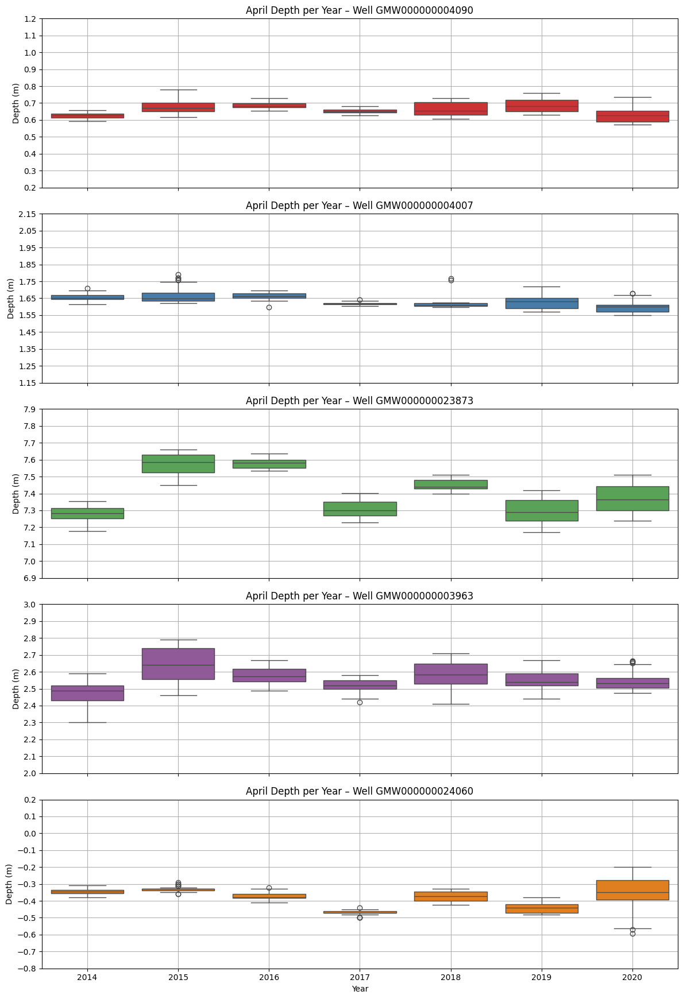

In [261]:
apr_data = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Month'] == 4) &
    (df_depth_3['Year'].between(2014, 2020))
]

# Desired visual tick step
tick_interval = 0.1
target_num_ticks = 10  # Aim for ~10 ticks on each plot

# Plot
fig, axes = plt.subplots(len(highlight_wells), 1, figsize=(12, 3.5 * len(highlight_wells)), sharex=True)

for i, well_id in enumerate(highlight_wells):
    ax = axes[i]
    well_data = apr_data[apr_data['Well_ID'] == well_id]

    # Get well-specific depth range
    dmin = well_data['Depth'].min()
    dmax = well_data['Depth'].max()

    # Round min/max to nearest 0.1
    dmin_rounded = np.floor(dmin / tick_interval) * tick_interval
    dmax_rounded = np.ceil(dmax / tick_interval) * tick_interval

    # Expand range if too small to get enough ticks
    while (dmax_rounded - dmin_rounded) < (tick_interval * (target_num_ticks - 1)):
        dmin_rounded -= tick_interval / 2
        dmax_rounded += tick_interval / 2

    # Create tick list
    yticks = np.arange(dmin_rounded, dmax_rounded + tick_interval, tick_interval)

    # Plot
    sns.boxplot(data=well_data, x='Year', y='Depth', ax=ax, color=well_color_map[well_id])
    ax.set_title(f"April Depth per Year – Well {well_id}")
    ax.set_ylabel("Depth (m)")
    ax.set_ylim(dmin_rounded, dmax_rounded)
    ax.set_yticks(yticks)
    ax.grid(True)

axes[-1].set_xlabel("Year")
plt.tight_layout()
plt.show()

### Summer

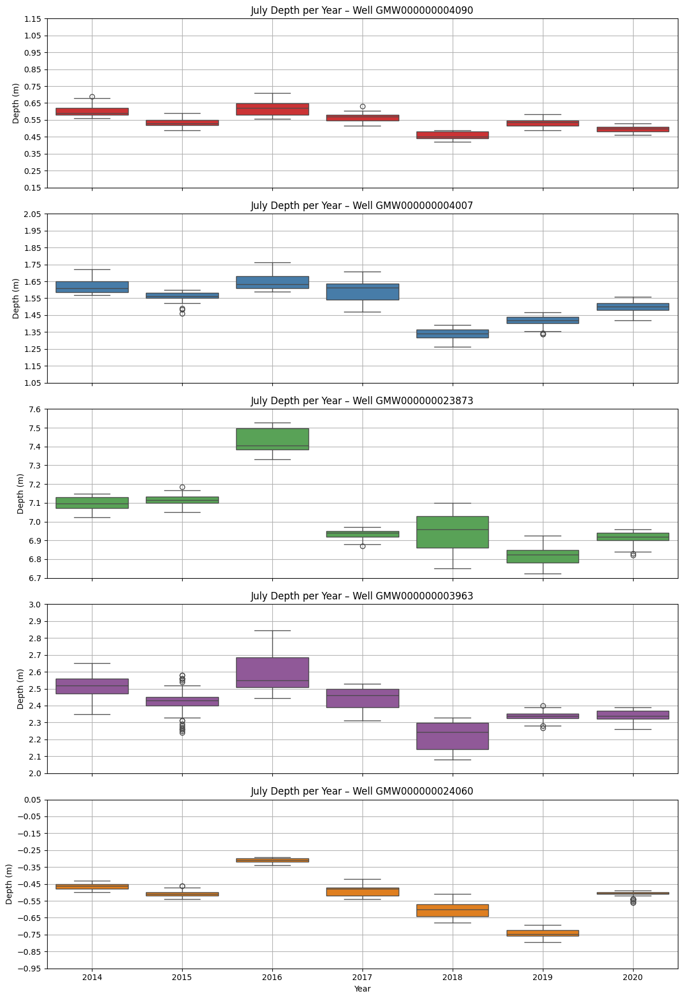

In [258]:
july_data = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Month'] == 7) &
    (df_depth_3['Year'].between(2014, 2020))
]

# Desired visual tick step
tick_interval = 0.1
target_num_ticks = 10  # Aim for ~10 ticks on each plot

# Plot
fig, axes = plt.subplots(len(highlight_wells), 1, figsize=(12, 3.5 * len(highlight_wells)), sharex=True)

for i, well_id in enumerate(highlight_wells):
    ax = axes[i]
    well_data = july_data[july_data['Well_ID'] == well_id]

    # Get well-specific depth range
    dmin = well_data['Depth'].min()
    dmax = well_data['Depth'].max()

    # Round min/max to nearest 0.1
    dmin_rounded = np.floor(dmin / tick_interval) * tick_interval
    dmax_rounded = np.ceil(dmax / tick_interval) * tick_interval

    # Expand range if too small to get enough ticks
    while (dmax_rounded - dmin_rounded) < (tick_interval * (target_num_ticks - 1)):
        dmin_rounded -= tick_interval / 2
        dmax_rounded += tick_interval / 2

    # Create tick list
    yticks = np.arange(dmin_rounded, dmax_rounded + tick_interval, tick_interval)

    # Plot
    sns.boxplot(data=well_data, x='Year', y='Depth', ax=ax, color=well_color_map[well_id])
    ax.set_title(f"July Depth per Year – Well {well_id}")
    ax.set_ylabel("Depth (m)")
    ax.set_ylim(dmin_rounded, dmax_rounded)
    ax.set_yticks(yticks)
    ax.grid(True)

axes[-1].set_xlabel("Year")
plt.tight_layout()
plt.show()

### Fall

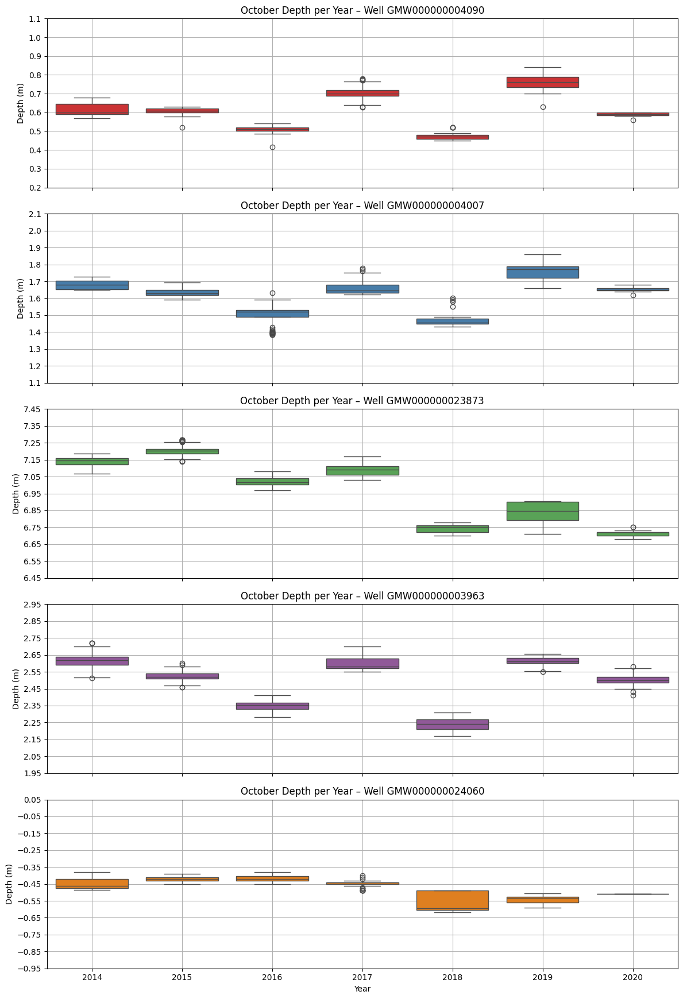

In [260]:
oct_data = df_depth_3[
    (df_depth_3['Well_ID'].isin(highlight_wells)) &
    (df_depth_3['Month'] == 10) &
    (df_depth_3['Year'].between(2014, 2020))
]

# Desired visual tick step
tick_interval = 0.1
target_num_ticks = 10  # Aim for ~10 ticks on each plot

# Plot
fig, axes = plt.subplots(len(highlight_wells), 1, figsize=(12, 3.5 * len(highlight_wells)), sharex=True)

for i, well_id in enumerate(highlight_wells):
    ax = axes[i]
    well_data = oct_data[oct_data['Well_ID'] == well_id]

    # Get well-specific depth range
    dmin = well_data['Depth'].min()
    dmax = well_data['Depth'].max()

    # Round min/max to nearest 0.1
    dmin_rounded = np.floor(dmin / tick_interval) * tick_interval
    dmax_rounded = np.ceil(dmax / tick_interval) * tick_interval

    # Expand range if too small to get enough ticks
    while (dmax_rounded - dmin_rounded) < (tick_interval * (target_num_ticks - 1)):
        dmin_rounded -= tick_interval / 2
        dmax_rounded += tick_interval / 2

    # Create tick list
    yticks = np.arange(dmin_rounded, dmax_rounded + tick_interval, tick_interval)

    # Plot
    sns.boxplot(data=well_data, x='Year', y='Depth', ax=ax, color=well_color_map[well_id])
    ax.set_title(f"October Depth per Year – Well {well_id}")
    ax.set_ylabel("Depth (m)")
    ax.set_ylim(dmin_rounded, dmax_rounded)
    ax.set_yticks(yticks)
    ax.grid(True)

axes[-1].set_xlabel("Year")
plt.tight_layout()
plt.show()

## All months across year 2016

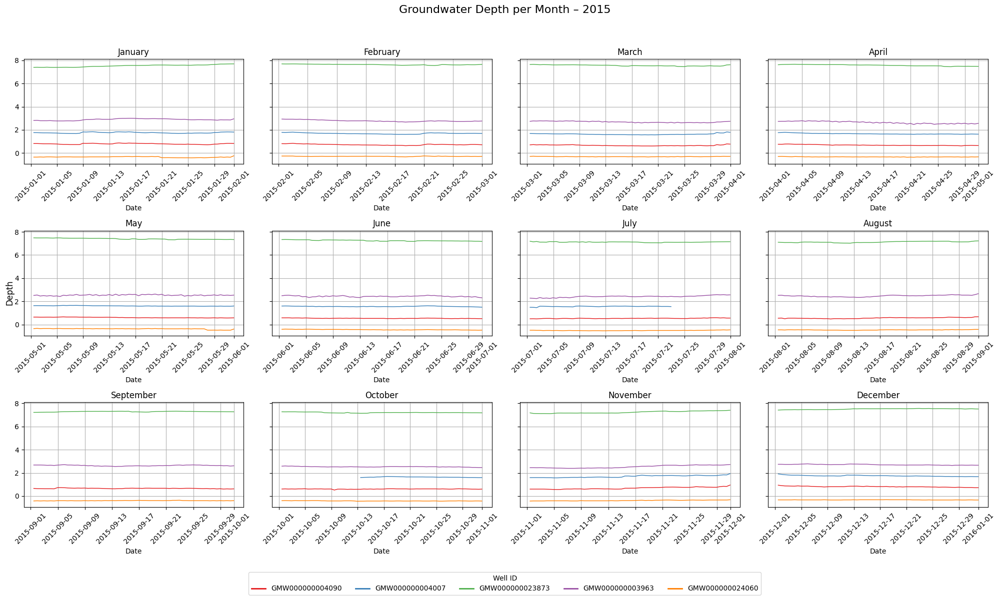

In [210]:
df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])

# Color mapping
palette = sns.color_palette("Set1", n_colors=len(highlight_wells))
well_color_map = dict(zip(highlight_wells, palette))

# Set up 12-month subplot layout
fig, axes = plt.subplots(3, 4, figsize=(20, 12), sharey=True)
axes = axes.flatten()

for month in range(1, 13):
    ax = axes[month - 1]
    
    # Filter data for the month
    df_month = df_depth_3[
        (df_depth_3['Well_ID'].isin(highlight_wells)) &
        (df_depth_3['Date'].dt.year == 2015) &
        (df_depth_3['Date'].dt.month == month)
    ].sort_values(by=['Well_ID', 'Date'])
    
    # Plot each well
    for well_id in highlight_wells:
        well_data = df_month[df_month['Well_ID'] == well_id]
        ax.plot(well_data['Date'], well_data['Depth'],
                color=well_color_map[well_id], linewidth=1)
    
    ax.set_title(pd.to_datetime(f"2016-{month:02d}-01").strftime("%B"))
    ax.set_xlabel("Date")
    ax.grid(True)
    ax.tick_params(axis='x', labelrotation=45)

# Shared y-axis label
fig.text(0.0001, 0.5, 'Depth', va='center', rotation='vertical', fontsize=12)
fig.suptitle("Groundwater Depth per Month – 2015", fontsize=16)

# Create shared legend outside plot
handles = [plt.Line2D([0], [0], color=well_color_map[wid], lw=2) for wid in highlight_wells]
labels = highlight_wells
fig.legend(handles, labels, title="Well ID", loc='lower center', ncol=len(highlight_wells), bbox_to_anchor=(0.5, -0.01))

plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

## All months across year 2017

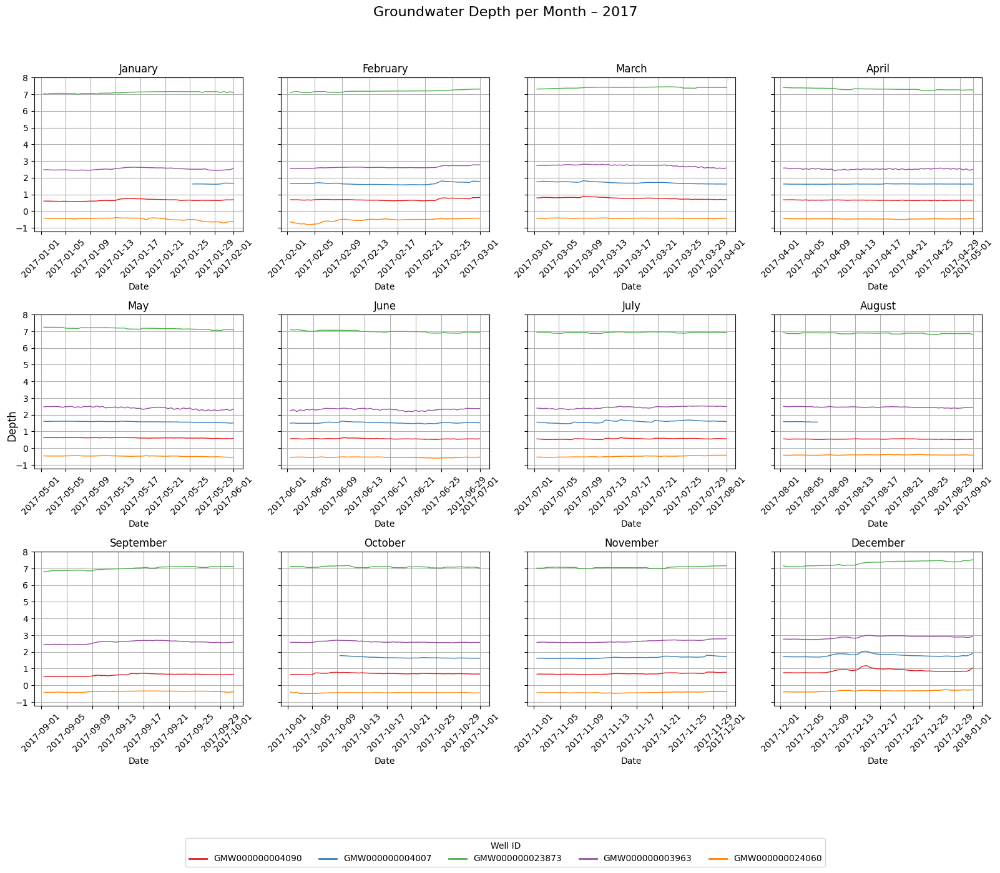

In [232]:
# Set up 12-month subplot layout
fig, axes = plt.subplots(3, 4, figsize=(16, 14), sharey=True)
axes = axes.flatten()

for month in range(1, 13):
    ax = axes[month - 1]
    
    # Filter data for the month
    df_month = df_depth_3[
        (df_depth_3['Well_ID'].isin(highlight_wells)) &
        (df_depth_3['Date'].dt.year == 2017) &
        (df_depth_3['Date'].dt.month == month)
    ].sort_values(by=['Well_ID', 'Date'])

    # Plot each well
    for well_id in highlight_wells:
        well_data = df_month[df_month['Well_ID'] == well_id]
        ax.plot(well_data['Date'], well_data['Depth'],
                color=well_color_map[well_id], linewidth=1)

    # Set y-axis ticks to 1 meter intervals based on data range
    ymin = df_month['Depth'].min()
    ymax = df_month['Depth'].max()
    if not np.isnan(ymin) and not np.isnan(ymax):
        ax.set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + 1, 1))

    ax.set_title(pd.to_datetime(f"2017-{month:02d}-01").strftime("%B"))
    ax.set_xlabel("Date")
    ax.grid(True)
    ax.tick_params(axis='x', labelrotation=45)

    # Shared y-axis label
fig.text(0.0001, 0.5, 'Depth', va='center', rotation='vertical', fontsize=12)
fig.suptitle("Groundwater Depth per Month – 2017", fontsize=16)

# Create shared legend outside plot
handles = [plt.Line2D([0], [0], color=well_color_map[wid], lw=2) for wid in highlight_wells]
labels = highlight_wells
fig.legend(handles, labels, title="Well ID", loc='lower center', ncol=len(highlight_wells), bbox_to_anchor=(0.5, -0.01))

plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.show()


## Timeseries for entire year: 2014 - 2020

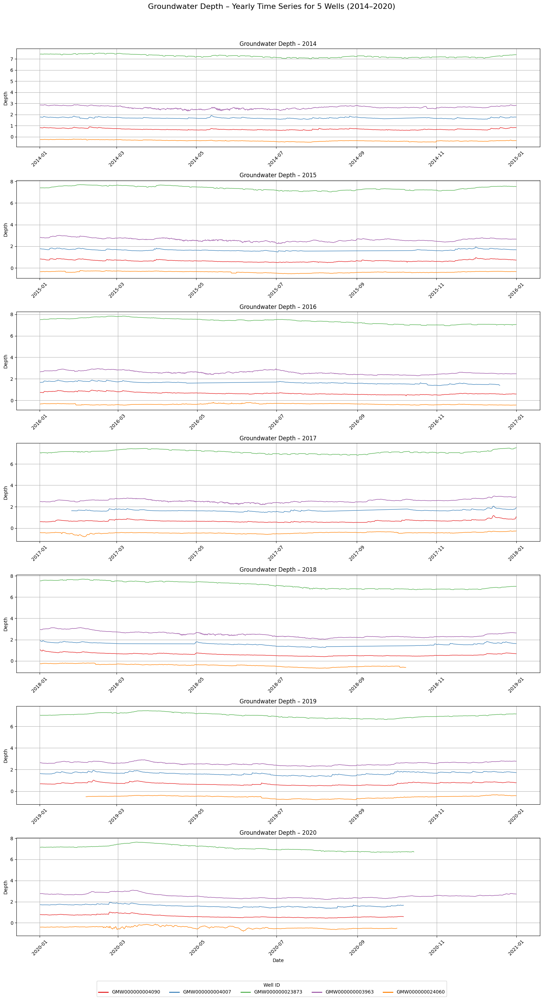

In [215]:
# Ensure datetime is parsed
df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])

# Define the years and wells
years = list(range(2014, 2021))
highlight_wells = [
    'GMW000000004090', 'GMW000000004007', 'GMW000000023873',
    'GMW000000003963', 'GMW000000024060'
]

# Create a color map for the wells
palette = sns.color_palette("Set1", n_colors=len(highlight_wells))
well_color_map = dict(zip(highlight_wells, palette))

# Set up subplots: 7 rows × 1 column
fig, axes = plt.subplots(len(years), 1, figsize=(16, 30), sharex=False)

for i, year in enumerate(years):
    ax = axes[i]

    # Filter data for this year
    df_year = df_depth_3[
        (df_depth_3['Well_ID'].isin(highlight_wells)) &
        (df_depth_3['Date'].dt.year == year)
    ].sort_values(by=['Well_ID', 'Date'])

    # Plot each well
    for well_id in highlight_wells:
        well_data = df_year[df_year['Well_ID'] == well_id]
        ax.plot(well_data['Date'], well_data['Depth'], label=well_id,
                color=well_color_map[well_id], linewidth=1)

    ax.set_title(f"Groundwater Depth – {year}")
    ax.set_ylabel("Depth")
    ax.grid(True)
    ax.tick_params(axis='x', labelrotation=45)

# Label x-axis only on the last plot
axes[-1].set_xlabel("Date")

# Move legend to bottom of the full figure
handles = [plt.Line2D([0], [0], color=well_color_map[wid], lw=2) for wid in highlight_wells]
labels = highlight_wells
fig.legend(handles, labels, title="Well ID", loc='lower center', ncol=len(highlight_wells), bbox_to_anchor=(0.5, 0.01))

# Final formatting
fig.suptitle("Groundwater Depth – Yearly Time Series for 5 Wells (2014–2020)", fontsize=16)
plt.tight_layout(rect=[0, 0.04, 1, 0.96])
plt.show()

/var/folders/fr/h0n611t55y51b_mts5q50l540000gn/T/ipykernel_60391/4041858659.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  depth_series = well_data['Depth'].resample('12H').mean().interpolate()


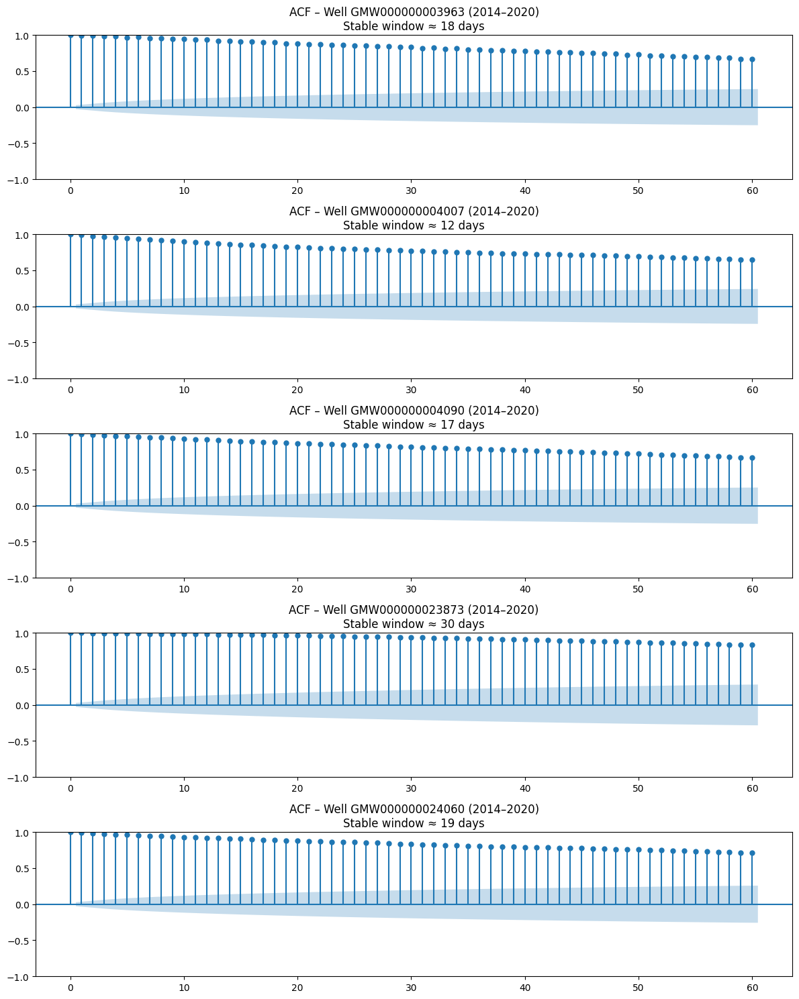

In [282]:
df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])

# Set number of lags (e.g. 60 lags = 30 days at 12-hour resolution)
lags = 60
lag_interval_hours = 12

# Create ACF plots
fig, axes = plt.subplots(len(highlight_wells), 1, figsize=(12, 3 * len(highlight_wells)))

for i, well_id in enumerate(highlight_wells):
    # Filter and prepare well data
    well_data = df_depth_3[df_depth_3['Well_ID'] == well_id].copy()
    well_data = well_data.set_index('Date').sort_index()

    # Limit to years 2014–2020
    well_data = well_data[(well_data.index.year >= 2014) & (well_data.index.year <= 2020)]

    # Resample to 12H and interpolate
    depth_series = well_data['Depth'].resample('12H').mean().interpolate()

    # Compute numerical ACF
    acf_values = acf(depth_series.dropna(), nlags=lags)

    # Find first lag where ACF drops below 0.8
    try:
        drop_index = np.argmax(acf_values < 0.8)
        if acf_values[drop_index] >= 0.8:
            stable_window_hours = lags * lag_interval_hours
        else:
            stable_window_hours = drop_index * lag_interval_hours
    except ValueError:
        stable_window_hours = None

    # Plot ACF
    plot_acf(depth_series.dropna(), lags=lags, ax=axes[i])
    title = f"ACF – Well {well_id} (2014–2020)"
    if stable_window_hours:
        title += f"\nStable window ≈ {stable_window_hours // 24} days"
    axes[i].set_title(title)

plt.tight_layout()
plt.show()

In [389]:
df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])
df_depth_3['Year'] = df_depth_3['Date'].dt.year
df_depth_3['Month'] = df_depth_3['Date'].dt.month

df_filtered = df_depth_3[['Well_ID', 'Date', 'Depth', 'Year', 'Month', 'geometry']].dropna(subset=['Well_ID', 'Date', 'Depth', 'geometry'])

# Compute delta_days
df_filtered = df_filtered.sort_values(by=['Well_ID', 'Date'])
df_filtered['delta_days'] = df_filtered.groupby('Well_ID')['Date'].diff().dt.total_seconds() / (60 * 60 * 24)

# Group by Well + Year + Month and compute mean interval
agg_df = df_filtered.groupby(['Well_ID', 'Year', 'Month'])['delta_days'].mean().reset_index()
agg_df['qualifies'] = agg_df['delta_days'] <= 5  # condition: ≤14 days

# Pivot to wide format: rows = Well_ID, cols = Year-Month, values = qualifies
agg_df['YearMonth'] = agg_df['Year'].astype(str) + "-" + agg_df['Month'].astype(str).str.zfill(2)
pivot = agg_df.pivot(index='Well_ID', columns='YearMonth', values='qualifies')

# Count how many wells qualify per month
coverage_count = pivot.sum(axis=0).sort_values(ascending=False)

# Display top months with most coverage
top_months = coverage_count.head(50)
top_months

YearMonth
2019-03    19
2018-10    19
2018-08    19
2018-07    19
2018-06    19
2018-05    19
2019-04    19
2019-05    19
2019-06    19
2019-07    19
2019-08    19
2019-09    19
2019-10    19
2019-11    19
2019-12    19
2018-03    19
2016-07    18
2016-08    18
2016-09    18
2016-10    18
2016-11    18
2016-12    18
2017-01    18
2017-02    18
2011-06    18
2011-07    18
2015-11    18
2011-08    18
2016-04    18
2016-03    18
2016-02    18
2017-05    18
2016-01    18
2015-12    18
2011-09    18
2011-10    18
2015-01    18
2014-10    18
2013-11    18
2014-06    18
2014-05    18
2013-12    18
2017-04    18
2017-08    18
2017-06    18
2018-09    18
2017-07    18
2010-11    18
2010-12    18
2011-01    18
dtype: object

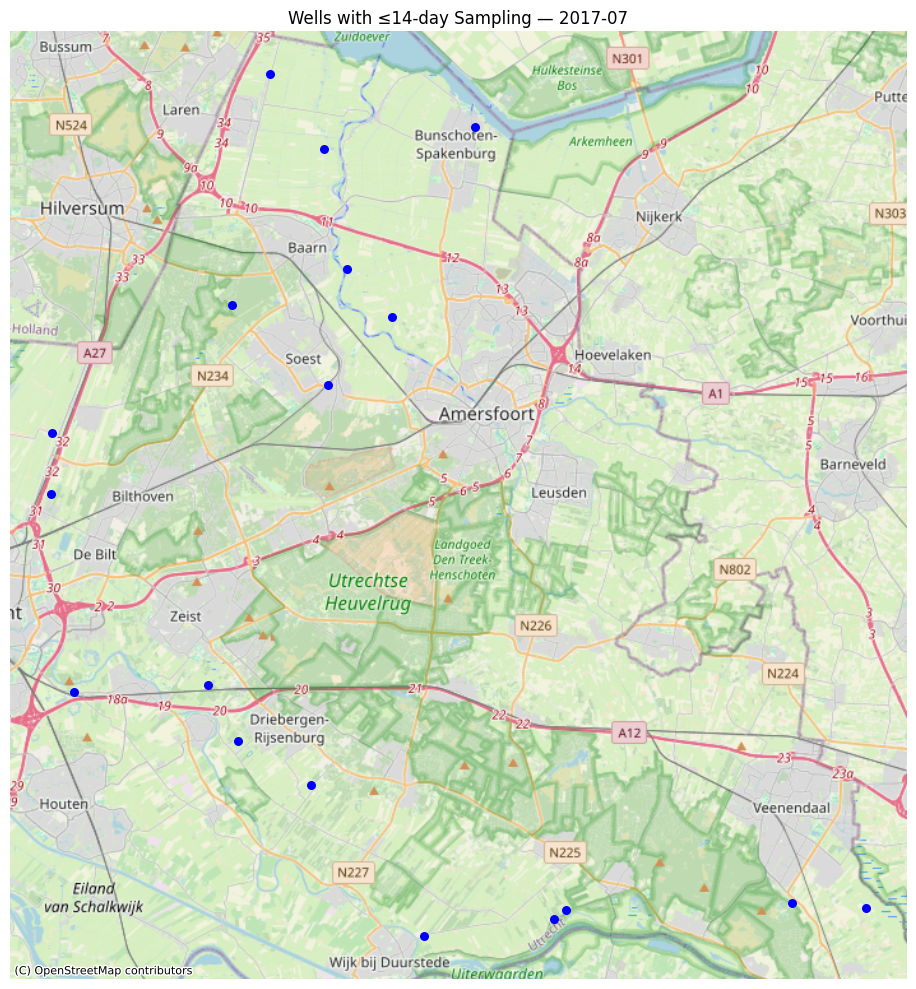

('2017-07', 18)

In [390]:
best_month = coverage_count.index[46]

# Get wells that qualify for the best month
qualifying_wells = agg_df[(agg_df['YearMonth'] == best_month) & (agg_df['qualifies'])]['Well_ID'].unique()
df_best_month = df[(df['Well_ID'].isin(qualifying_wells)) & 
                   (df['Year'].astype(str) + "-" + df['Month'].astype(str).str.zfill(2) == best_month)]

# Drop duplicates to get unique wells for plotting
gdf_plot = gpd.GeoDataFrame(df_best_month.drop_duplicates(subset='Well_ID')[['Well_ID', 'geometry']], 
                            geometry='geometry', crs="EPSG:4326").to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))
gdf_plot.plot(ax=ax, color='blue', markersize=30)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title(f"Wells with ≤14-day Sampling — {best_month}")
ax.axis('off')
plt.tight_layout()
plt.show()

# Also return the month and number of qualifying wells
best_month, len(qualifying_wells)

In [391]:
# Get all wells that qualify in that month
qualified_wells = pivot[pivot[best_month] == True].index.tolist()

# Step 2: Extract coordinates from full dataset
df_geo = df_depth_3[['Well_ID', 'geometry']].drop_duplicates()
df_geo = df_geo[df_geo['Well_ID'].isin(qualified_wells)]

df_geo['Latitude'] = df_geo['geometry'].apply(lambda p: p.y)
df_geo['Longitude'] = df_geo['geometry'].apply(lambda p: p.x)

# Step 3: Haversine distance function
def haversine(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1 
    dlon = lon2 - lon1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    return 6371 * c  # in km

# Step 4: Count neighbors within 10 km
search_radius_km = 8

coords = df_geo[['Well_ID', 'Latitude', 'Longitude']].values
results = []

for i, (id1, lat1, lon1) in enumerate(coords):
    count = 0
    for j, (id2, lat2, lon2) in enumerate(coords):
        if i != j:
            dist = haversine(lat1, lon1, lat2, lon2)
            if dist <= search_radius_km:
                count += 1
    results.append((id1, count))

# Step 5: Find the best center
neighbor_df = pd.DataFrame(results, columns=['Well_ID', 'Neighbor_Count'])
best_center = neighbor_df.sort_values(by='Neighbor_Count', ascending=False).iloc[0]

print("Best center well:", best_center['Well_ID'])
print("Wells within 8 km:", best_center['Neighbor_Count'] + 1)

Best center well: GMW000000024040
Wells within 8 km: 7


/var/folders/fr/h0n611t55y51b_mts5q50l540000gn/T/ipykernel_60391/2614353832.py:27: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


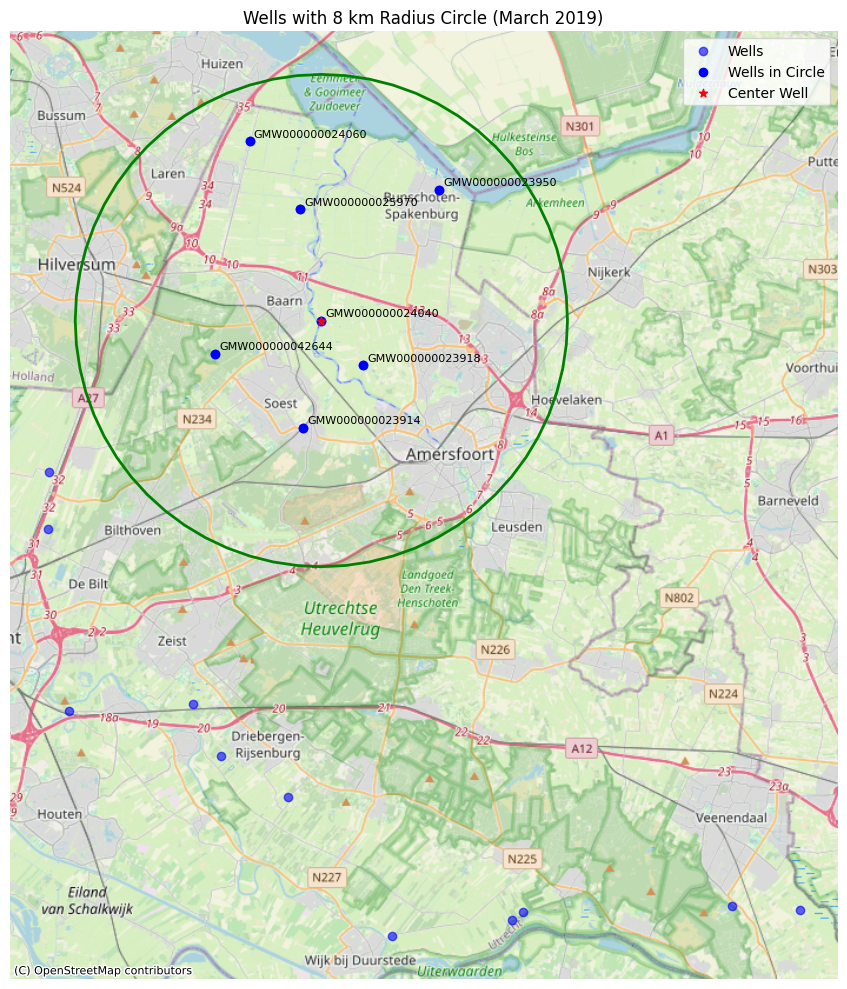

In [393]:
# Step 1: Create a GeoDataFrame from the selected wells
gdf_wells = gpd.GeoDataFrame(df_geo, geometry='geometry', crs="EPSG:4326")  # WGS84
gdf_wells = gdf_wells.to_crs(epsg=3857)  # Convert to Web Mercator for basemap compatibility

# Step 2: Get center well geometry and create 2km buffer
center_geom = gdf_wells[gdf_wells['Well_ID'] == best_center['Well_ID']].geometry.iloc[0]
circle = center_geom.buffer(16000)

wells_in_circle = gdf_wells[gdf_wells.geometry.within(circle)]

# Step 3: Plot
fig, ax = plt.subplots(figsize=(10, 10))
gdf_wells.plot(ax=ax, color='blue', alpha=0.6, label='Wells')
wells_in_circle.plot(ax=ax, color='blue', label='Wells in Circle')
gpd.GeoSeries([center_geom], crs=gdf_wells.crs).plot(ax=ax, color='red', marker='*', label='Center Well')
gpd.GeoSeries([circle], crs=gdf_wells.crs).plot(ax=ax, edgecolor='green', facecolor='none', linewidth=2, label='2 km Radius')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Annotate Well_IDs inside the circle
for _, row in wells_in_circle.iterrows():
    ax.annotate(row['Well_ID'], xy=(row.geometry.x, row.geometry.y), xytext=(3, 3),
                textcoords="offset points", fontsize=8, color='black')

# Annotate and format
ax.set_title('Wells with 8 km Radius Circle (March 2019)')
ax.legend()
ax.axis('off')
plt.tight_layout()
plt.show()

In [394]:
wells_within_radius = wells_in_circle['Well_ID'].tolist()

# Step 3: Filter depth data to those wells and May 2004
df_depth_3['Date'] = pd.to_datetime(df_depth_3['Date'])
df_depth_3['Month'] = df_depth_3['Date'].dt.month
df_depth_3['Year'] = df_depth_3['Date'].dt.year

year, month = map(int, best_month.split('-'))

may_2004_df = df_depth_3[
    (df_depth_3['Well_ID'].isin(wells_within_radius)) &
    (df_depth_3['Year'] == year) &
    (df_depth_3['Month'] == month)
]

# Step 4: Pivot the table: rows = date, columns = well_id, values = depth
depth_pivot = may_2004_df.pivot_table(index='Date', columns='Well_ID', values='Depth')

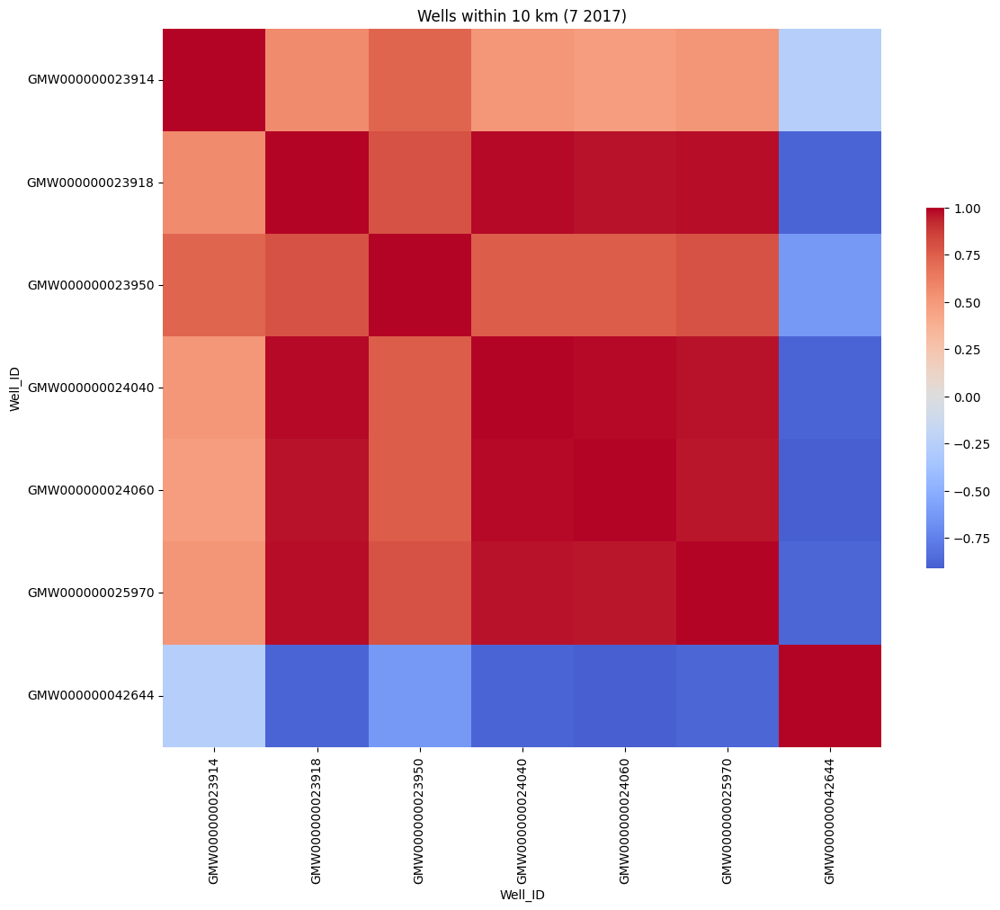

In [395]:
# Normalize using Z-score per column
depth_normalized = (depth_pivot - depth_pivot.mean()) / depth_pivot.std()

# Correlation matrix on normalized data
normalized_corr_matrix = depth_normalized.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(normalized_corr_matrix, cmap='coolwarm', center=0, square=True, cbar_kws={'shrink': 0.5})
plt.title(f"Wells within 10 km ({month} {year})")
plt.tight_layout()
plt.show()

In [73]:
df = df_depth_3.copy()

df['Date'] = pd.to_datetime(df['Date'])

df['Year'] = df['Date'].dt.year
depth_df = df[df['Year'] == 2020].dropna(subset=['Depth'])

# Pivot to wide format: rows = date, columns = wells, values = depth
depth_pivot = depth_df.pivot_table(index='Date', columns='Well_ID', values='Depth')

#too few observations - drop them(e.g., <10 days of data)
valid_wells = depth_pivot.count()[depth_pivot.count() >= 10].index.tolist()
depth_pivot = depth_pivot[valid_wells]

corr_matrix = depth_pivot.corr() #correlation matrix
# coords of valid wells:
well_coords = df[['Well_ID', 'geometry']].drop_duplicates()
well_coords = well_coords[well_coords['Well_ID'].isin(valid_wells)]
well_coords['Latitude'] = well_coords['geometry'].apply(lambda p: p.y)
well_coords['Longitude'] = well_coords['geometry'].apply(lambda p: p.x)

def haversine(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1 
    dlon = lon2 - lon1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    return 6371 * c

#collect distance-correlation pairs
pairs = []
well_list = valid_wells

for i in range(len(well_list)):
    for j in range(i + 1, len(well_list)):
        w1, w2 = well_list[i], well_list[j]
        if pd.notna(corr_matrix.loc[w1, w2]):
            lat1, lon1 = well_coords[well_coords['Well_ID'] == w1][['Latitude', 'Longitude']].values[0]
            lat2, lon2 = well_coords[well_coords['Well_ID'] == w2][['Latitude', 'Longitude']].values[0]
            distance = haversine(lat1, lon1, lat2, lon2)
            correlation = corr_matrix.loc[w1, w2]
            pairs.append((distance, correlation))

dist_corr_df = pd.DataFrame(pairs, columns=['Distance_km', 'Correlation'])
dist_corr_df.describe()


,Distance_km,Correlation
count,136.000000,136.000000
mean,18.115665,0.716875
std,9.276887,0.211376
min,0.535145,-0.033462
25%,10.159187,0.572543
50%,18.016364,0.761068
75%,25.454059,0.894844
max,37.697679,0.986712


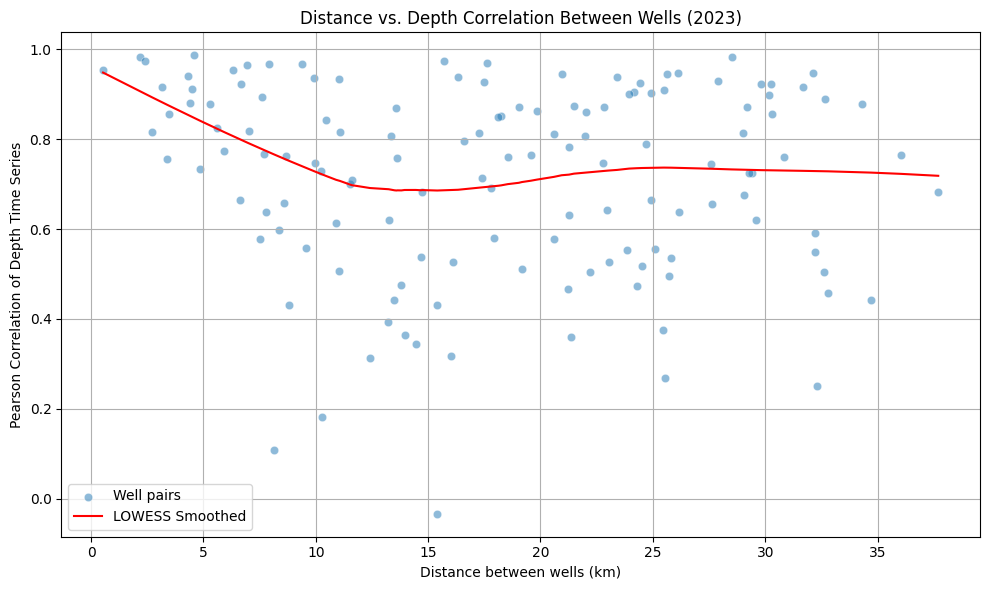

In [74]:
smoothed = lowess(endog=dist_corr_df['Correlation'], exog=dist_corr_df['Distance_km'], frac=0.6)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=dist_corr_df, x='Distance_km', y='Correlation', alpha=0.5, label='Well pairs')
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red', label='LOWESS Smoothed')

plt.title('Distance vs. Depth Correlation Between Wells (2023)')
plt.xlabel('Distance between wells (km)')
plt.ylabel('Pearson Correlation of Depth Time Series')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

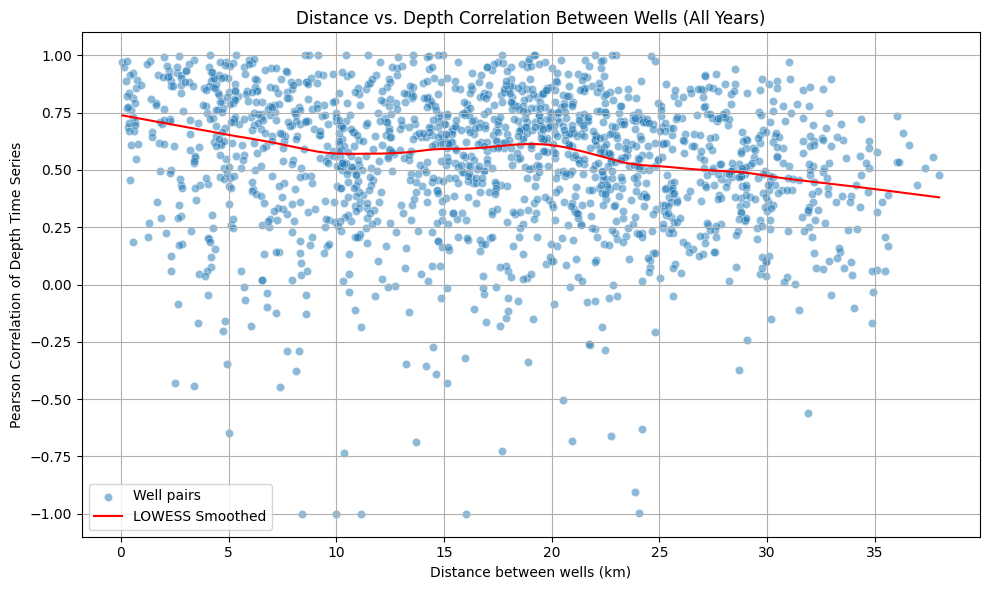

In [427]:
df = df_depth_3.copy()

df['Date'] = pd.to_datetime(df['Date'])
df = df.dropna(subset=['Depth'])

# Pivot to wide format
depth_pivot_all = df.pivot_table(index='Date', columns='Well_ID', values='Depth')

# Filter wells with enough observations
valid_wells_all = depth_pivot_all.count()[depth_pivot_all.count() >= 10].index.tolist()
depth_pivot_all = depth_pivot_all[valid_wells_all]

# Compute correlation matrix
corr_matrix_all = depth_pivot_all.corr()

# Get coordinates
well_coords_all = df[['Well_ID', 'geometry']].drop_duplicates(subset='Well_ID')
well_coords_all = well_coords_all[well_coords_all['Well_ID'].isin(valid_wells_all)]
well_coords_all['Latitude'] = well_coords_all['geometry'].apply(lambda p: p.y)
well_coords_all['Longitude'] = well_coords_all['geometry'].apply(lambda p: p.x)

# Haversine distance function
def haversine(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1 
    dlon = lon2 - lon1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    return 6371 * c

# Compute distance-correlation pairs
pairs_all = []
well_list_all = valid_wells_all

for i in range(len(well_list_all)):
    for j in range(i + 1, len(well_list_all)):
        w1, w2 = well_list_all[i], well_list_all[j]
        if pd.notna(corr_matrix_all.loc[w1, w2]):
            lat1, lon1 = well_coords_all[well_coords_all['Well_ID'] == w1][['Latitude', 'Longitude']].values[0]
            lat2, lon2 = well_coords_all[well_coords_all['Well_ID'] == w2][['Latitude', 'Longitude']].values[0]
            distance = haversine(lat1, lon1, lat2, lon2)
            correlation = corr_matrix_all.loc[w1, w2]
            pairs_all.append((distance, correlation))

# Convert to DataFrame
dist_corr_all_df = pd.DataFrame(pairs_all, columns=['Distance_km', 'Correlation'])

# LOWESS smoothing and plot
smoothed = lowess(endog=dist_corr_all_df['Correlation'],
                  exog=dist_corr_all_df['Distance_km'],
                  frac=0.3)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=dist_corr_all_df, x='Distance_km', y='Correlation', alpha=0.5, label='Well pairs')
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red', label='LOWESS Smoothed')

plt.title('Distance vs. Depth Correlation Between Wells (All Years)')
plt.xlabel('Distance between wells (km)')
plt.ylabel('Pearson Correlation of Depth Time Series')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Groundwater depth measurements are spatially correlated and this correlation decreases as the distance between wells increases.

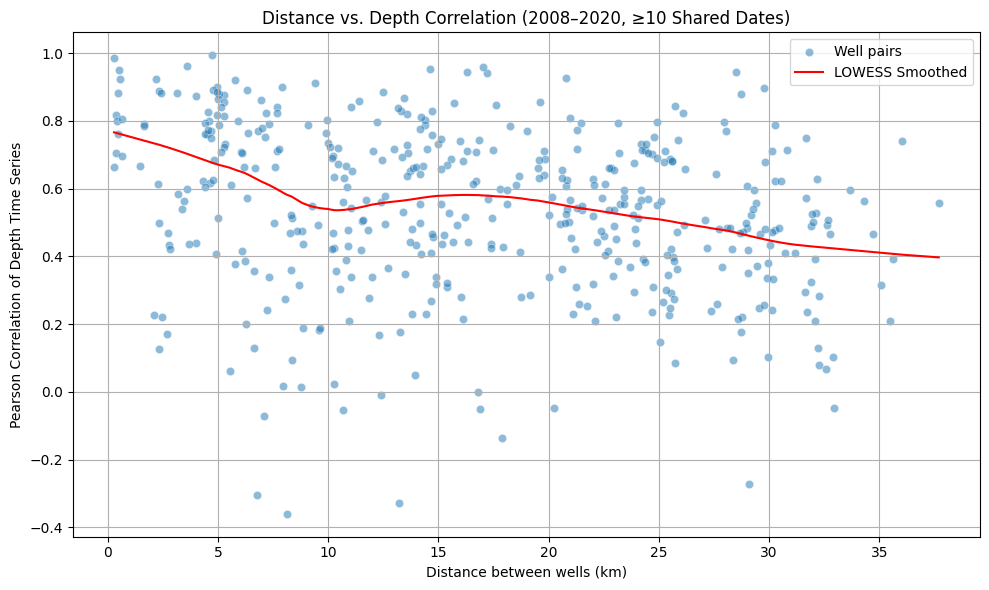

In [428]:
df = df_depth_3.copy()

df = df.dropna(subset=['Depth'])

# Filter for years 2008–2020
df = df[(df['Year'] >= 2008) & (df['Year'] <= 2020)]

# Pivot to wide format
depth_pivot = df.pivot_table(index='Date', columns='Well_ID', values='Depth')

# Filter wells with enough data points (≥10)
valid_wells = depth_pivot.count()[depth_pivot.count() >= 10].index.tolist()
depth_pivot = depth_pivot[valid_wells]

# Compute correlation matrix and shared timestamp count matrix
corr_matrix = depth_pivot.corr()
valid_counts = depth_pivot.notna().astype(int).T.dot(depth_pivot.notna().astype(int))

# Get coordinates
well_coords = df[['Well_ID', 'geometry']].drop_duplicates(subset='Well_ID')
well_coords = well_coords[well_coords['Well_ID'].isin(valid_wells)]
well_coords['Latitude'] = well_coords['geometry'].apply(lambda p: p.y)
well_coords['Longitude'] = well_coords['geometry'].apply(lambda p: p.x)

# Collect only (distance, correlation) for well pairs with at least 10 shared timestamps
pairs_filtered = []
for i in range(len(valid_wells)):
    for j in range(i + 1, len(valid_wells)):
        w1, w2 = valid_wells[i], valid_wells[j]
        shared = valid_counts.loc[w1, w2]
        if shared >= 10 and pd.notna(corr_matrix.loc[w1, w2]):
            lat1, lon1 = well_coords[well_coords['Well_ID'] == w1][['Latitude', 'Longitude']].values[0]
            lat2, lon2 = well_coords[well_coords['Well_ID'] == w2][['Latitude', 'Longitude']].values[0]
            dist = haversine(lat1, lon1, lat2, lon2)
            corr = corr_matrix.loc[w1, w2]
            pairs_filtered.append((dist, corr))

# Convert to DataFrame
dist_corr_filtered_df = pd.DataFrame(pairs_filtered, columns=['Distance_km', 'Correlation'])

# Plot LOWESS
smoothed = lowess(endog=dist_corr_filtered_df['Correlation'],
                  exog=dist_corr_filtered_df['Distance_km'],
                  frac=0.3)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=dist_corr_filtered_df, x='Distance_km', y='Correlation', alpha=0.5, label='Well pairs')
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red', label='LOWESS Smoothed')

plt.title('Distance vs. Depth Correlation (2008–2020, ≥10 Shared Dates)')
plt.xlabel('Distance between wells (km)')
plt.ylabel('Pearson Correlation of Depth Time Series')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()
